In [30]:
# ====================================================================
# NOTEBOOK 1: EXPLORATION DES DONNÉES DE FORAGE
# ====================================================================
# Ce notebook explore les données de forage pétrolier pour comprendre
# leur structure, qualité et relations entre variables.

In [31]:
# ====================================================================
# IMPORTS ET CONFIGURATION
# ====================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

In [32]:
# Configuration des graphiques
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

In [33]:
# Configuration Plotly
import plotly.io as pio
pio.templates.default = "plotly_white"

print(f"\n📈 VISUALISATIONS EXPLORATOIRES")
print("-" * 40)


📈 VISUALISATIONS EXPLORATOIRES
----------------------------------------


In [34]:
# ====================================================================
# VISUALISATIONS EXPLORATOIRES
# ====================================================================

📊 Distributions - Données de Formation:


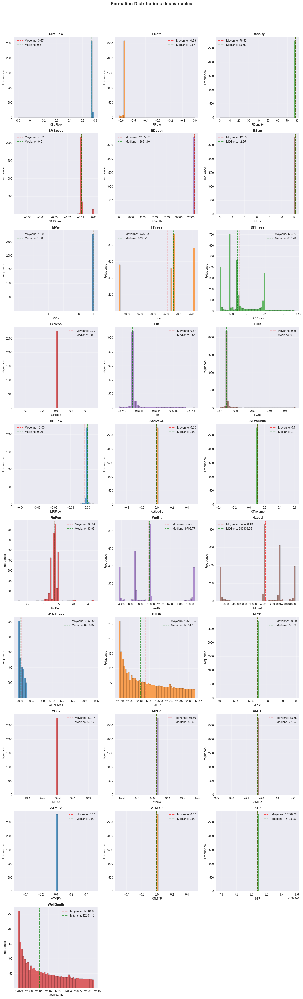


📊 Distributions - Données de Kick:


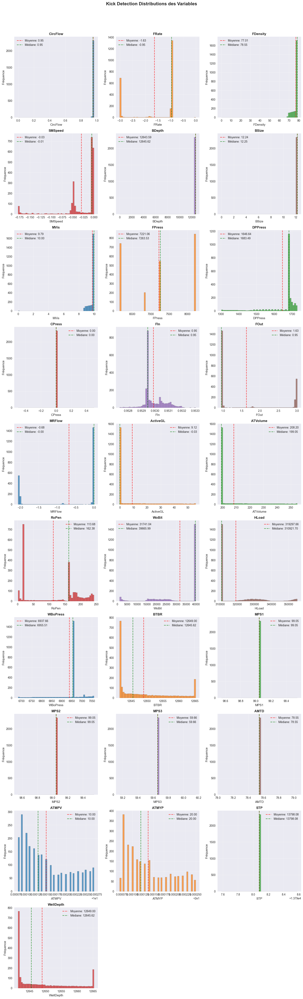

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 🔹 Charger les fichiers CSV
formation_df = pd.read_csv("C:/ML Drilling Oil & Gaz/ML-Drilling-Oil-Gaz/data/raw/Formation_Pressure_Prediction.csv")  # Remplace par ton chemin réel
kick_df = pd.read_csv("C:/ML Drilling Oil & Gaz/ML-Drilling-Oil-Gaz/data/raw/Kick_Detection.csv")            # Remplace par ton chemin réel

# 🔹 Fonction pour tracer les distributions
def plot_distributions(df, title_prefix=""):
    """Plot les distributions des variables numériques"""
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    n_cols = min(3, len(numeric_cols))
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    if n_cols == 1:
        axes = axes.reshape(-1, 1)
    
    fig.suptitle(f'{title_prefix} Distributions des Variables', fontsize=16, fontweight='bold')
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    
    for i, col in enumerate(numeric_cols):
        if i >= n_rows * n_cols:
            break
        row, col_idx = divmod(i, n_cols)
        
        axes[row, col_idx].hist(df[col].dropna(), bins=50, alpha=0.7, 
                               color=colors[i % len(colors)], edgecolor='black')
        axes[row, col_idx].set_title(f'{col}', fontweight='bold')
        axes[row, col_idx].set_xlabel(col)
        axes[row, col_idx].set_ylabel('Fréquence')
        axes[row, col_idx].grid(True, alpha=0.3)
        
        # Ajouter des statistiques
        mean_val = df[col].mean()
        median_val = df[col].median()
        axes[row, col_idx].axvline(mean_val, color='red', linestyle='--', alpha=0.7, label=f'Moyenne: {mean_val:.2f}')
        axes[row, col_idx].axvline(median_val, color='green', linestyle='--', alpha=0.7, label=f'Médiane: {median_val:.2f}')
        axes[row, col_idx].legend()
    
    # Supprimer les subplots vides
    for i in range(len(numeric_cols), n_rows * n_cols):
        row, col_idx = divmod(i, n_cols)
        fig.delaxes(axes[row, col_idx])
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # pour éviter que le suptitle chevauche
    plt.show()

# 🔹 Tracer les distributions
print("📊 Distributions - Données de Formation:")
plot_distributions(formation_df, "Formation")

print("\n📊 Distributions - Données de Kick:")
plot_distributions(kick_df, "Kick Detection")

In [36]:
# ====================================================================
# 2. Analyse de corrélation
# ====================================================================

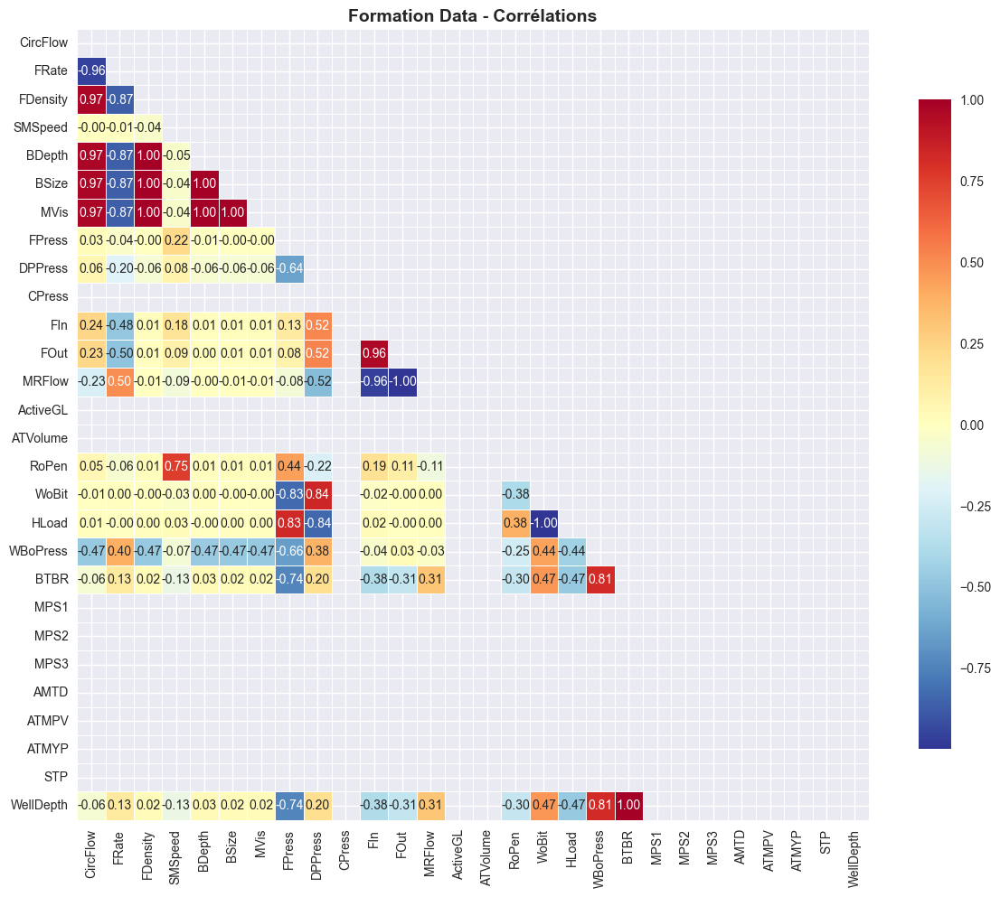


🔗 ANALYSE DES CORRÉLATIONS
----------------------------------------
Top 10 corrélations (en valeur absolue):
 1. CircFlow ↔ FDensity:  0.973 🔵
 2. CircFlow ↔ BSize:  0.973 🔵
 3. CircFlow ↔ MVis:  0.973 🔵
 4. CircFlow ↔ BDepth:  0.972 🔵
 5. CircFlow ↔ FRate: -0.957 🔴
 6. CircFlow ↔ CPress:    nan 🔵
 7. CircFlow ↔ ActiveGL:    nan 🔵
 8. CircFlow ↔ ATVolume:    nan 🔵
 9. CircFlow ↔ MPS1:    nan 🔵
10. CircFlow ↔ MPS2:    nan 🔵


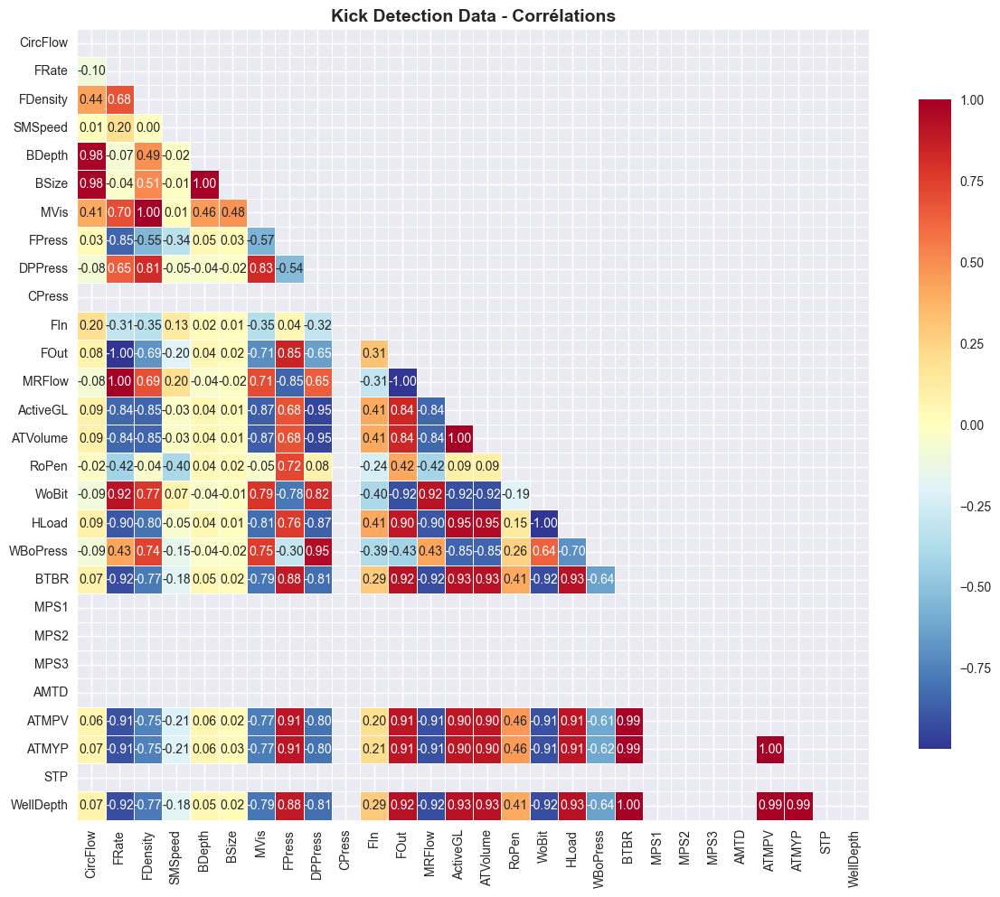


🔗 ANALYSE DES CORRÉLATIONS
----------------------------------------
Top 10 corrélations (en valeur absolue):
 1. CircFlow ↔ CPress:    nan 🔵
 2. CircFlow ↔ MPS1:    nan 🔵
 3. CircFlow ↔ MPS2:    nan 🔵
 4. CircFlow ↔ MPS3:    nan 🔵
 5. CircFlow ↔ AMTD:    nan 🔵
 6. CircFlow ↔ STP:    nan 🔵
 7. FRate ↔ CPress:    nan 🔵
 8. FRate ↔ FOut: -1.000 🔴
 9. FRate ↔ MRFlow:  1.000 🔵
10. CircFlow ↔ BDepth:  0.983 🔵


In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_correlation_analysis(df, title="Matrice de Corrélation"):
    """Analyse et visualise les corrélations"""
    numeric_df = df.select_dtypes(include=[np.number])
    
    if len(numeric_df.columns) < 2:
        print("⚠️ Pas assez de colonnes numériques pour l'analyse de corrélation")
        return
    
    # Calculer la matrice de corrélation
    correlation_matrix = numeric_df.corr()
    
    # Créer la heatmap
    plt.figure(figsize=(12, 10))
    mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    
    sns.heatmap(
        correlation_matrix, mask=mask, annot=True, cmap='RdYlBu_r',
        center=0, square=True, linewidths=0.5, cbar_kws={"shrink": .8},
        fmt='.2f'
    )
    
    plt.title(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Top corrélations
    print("\n🔗 ANALYSE DES CORRÉLATIONS")
    print("-" * 40)
    print(f"Top 10 corrélations (en valeur absolue):")
    
    # Extraire les corrélations sans la diagonale
    corr_pairs = []
    for i in range(len(correlation_matrix.columns)):
        for j in range(i+1, len(correlation_matrix.columns)):
            col1 = correlation_matrix.columns[i]
            col2 = correlation_matrix.columns[j]
            corr_val = correlation_matrix.iloc[i, j]
            corr_pairs.append((col1, col2, corr_val))
    
    # Trier par valeur absolue de corrélation
    corr_pairs.sort(key=lambda x: abs(x[2]), reverse=True)
    
    # Afficher les 10 plus fortes corrélations
    for i, (col1, col2, corr) in enumerate(corr_pairs[:10]):
        sign = "🔴" if corr < 0 else "🔵"
        print(f"{i+1:2d}. {col1} ↔ {col2}: {corr:6.3f} {sign}")

# 🔹 Appel de la fonction pour tes DataFrames
plot_correlation_analysis(formation_df, "Formation Data - Corrélations")
plot_correlation_analysis(kick_df, "Kick Detection Data - Corrélations")

In [38]:
# ====================================================================
# 3. Évolution temporelle (si données temporelles disponibles)
# ====================================================================

In [39]:
def plot_temporal_analysis(df, time_col='Timestamp'):
    """Analyse l'évolution temporelle des données"""
    if time_col not in df.columns:
        print(f"⚠️ Colonne temporelle '{time_col}' non trouvée")
        return
    
    # S'assurer que la colonne est en datetime
    if not pd.api.types.is_datetime64_any_dtype(df[time_col]):
        try:
            df[time_col] = pd.to_datetime(df[time_col])
        except:
            print(f"⚠️ Impossible de convertir '{time_col}' en datetime")
            return
    
    print(f"\n📅 ANALYSE TEMPORELLE")
    print("-" * 30)
    print(f"Période: {df[time_col].min()} à {df[time_col].max()}")
    print(f"Durée: {df[time_col].max() - df[time_col].min()}")
    print(f"Fréquence d'échantillonnage: {df[time_col].diff().mode().iloc[0]}")
    
    # Sélectionner les variables numériques principales
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    main_vars = [col for col in ['WOB', 'RPM', 'ROP', 'FlowRate', 'MudWeight', 'StandpipePressure'] 
                if col in numeric_cols][:4]  # Max 4 variables
    
    if not main_vars:
        main_vars = list(numeric_cols)[:4]
    
    # Graphique d'évolution temporelle
    fig, axes = plt.subplots(len(main_vars), 1, figsize=(15, 3*len(main_vars)))
    if len(main_vars) == 1:
        axes = [axes]
    
    fig.suptitle('📈 Évolution Temporelle des Paramètres de Forage', 
                fontsize=16, fontweight='bold')
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    
    for i, var in enumerate(main_vars):
        axes[i].plot(df[time_col], df[var], color=colors[i], alpha=0.7, linewidth=1)
        axes[i].set_title(f'{var}', fontweight='bold')
        axes[i].set_ylabel(var)
        axes[i].grid(True, alpha=0.3)
        axes[i].tick_params(axis='x', rotation=45)
        
        # Ajouter moyenne mobile si assez de données
        if len(df) > 100:
            rolling_mean = df[var].rolling(window=50, min_periods=1).mean()
            axes[i].plot(df[time_col], rolling_mean, color='red', 
                        linewidth=2, alpha=0.8, label='Moyenne mobile (50)')
            axes[i].legend()
    
    plt.tight_layout()
    plt.show()

# Analyse temporelle si données disponibles
if 'Timestamp' in kick_df.columns:
    plot_temporal_analysis(kick_df)
elif 'Timestamp' in formation_df.columns:
    plot_temporal_analysis(formation_df)

In [40]:
# ====================================================================
# 4. Analyse des variables cibles
# ====================================================================


🔹 Analyse automatique du dataset : Formation Data
Colonnes disponibles : ['CircFlow', 'FRate', 'FDensity', 'SMSpeed', 'BDepth', 'BSize', 'MVis', 'FPress', 'DPPress', 'CPress', 'FIn', 'FOut', 'MRFlow', 'ActiveGL', 'ATVolume', 'RoPen', 'WoBit', 'HLoad', 'WBoPress', 'BTBR', 'MPS1', 'MPS2', 'MPS3', 'AMTD', 'ATMPV', 'ATMYP', 'STP', 'WellDepth']
------------------------------------------------------------
📊 Colonnes numériques détectées : ['CircFlow', 'FRate', 'FDensity', 'SMSpeed', 'BDepth', 'BSize', 'MVis', 'FPress', 'DPPress', 'CPress', 'FIn', 'FOut', 'MRFlow', 'ActiveGL', 'ATVolume', 'RoPen', 'WoBit', 'HLoad', 'WBoPress', 'BTBR', 'MPS1', 'MPS2', 'MPS3', 'AMTD', 'ATMPV', 'ATMYP', 'STP', 'WellDepth']
📊 Colonnes catégorielles détectées : []

🎯 ANALYSE DE LA VARIABLE CIBLE: CircFlow
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.575
  • Médiane: 0.574
  • Écart-type: 0.011
  • Min: 0.000
  • Max: 0.590
  • Asymé

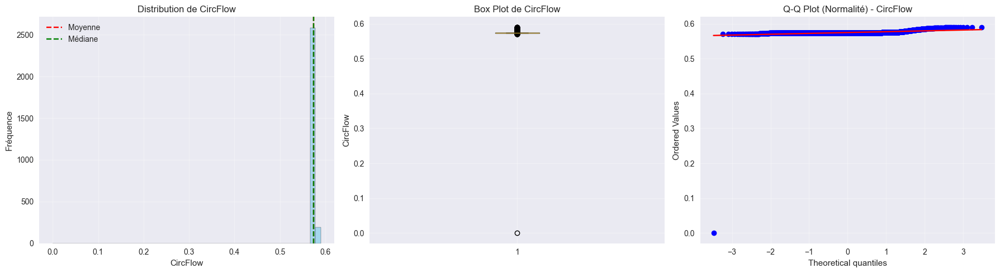


🎯 ANALYSE DE LA VARIABLE CIBLE: FRate
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: -0.576
  • Médiane: -0.574
  • Écart-type: 0.013
  • Min: -0.616
  • Max: 0.000
  • Asymétrie (skewness): 34.193
  • Aplatissement (kurtosis): 1594.634


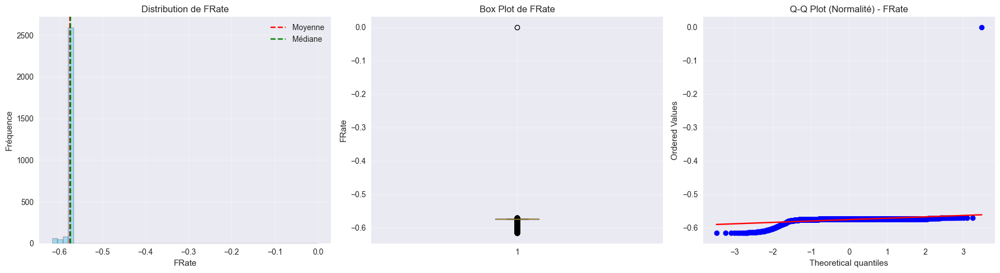


🎯 ANALYSE DE LA VARIABLE CIBLE: FDensity
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 78.519
  • Médiane: 78.547
  • Écart-type: 1.491
  • Min: 0.000
  • Max: 78.547
  • Asymétrie (skewness): -52.669
  • Aplatissement (kurtosis): 2774.000


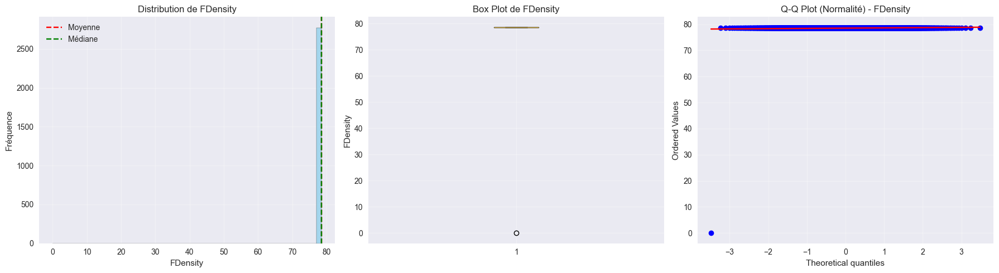


🎯 ANALYSE DE LA VARIABLE CIBLE: SMSpeed
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: -0.009
  • Médiane: -0.009
  • Écart-type: 0.004
  • Min: -0.057
  • Max: 0.000
  • Asymétrie (skewness): -5.237
  • Aplatissement (kurtosis): 51.102


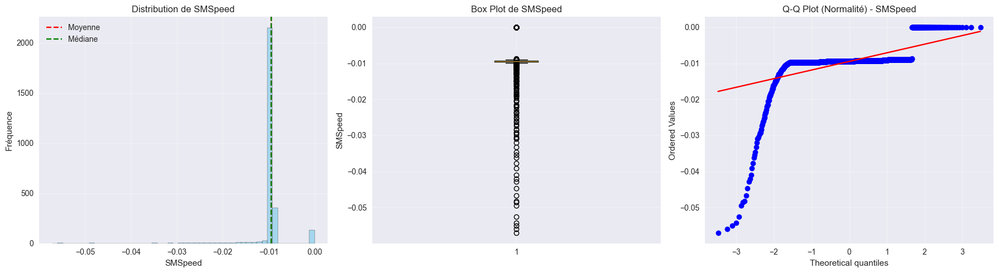


🎯 ANALYSE DE LA VARIABLE CIBLE: BDepth
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 12677.076
  • Médiane: 12681.100
  • Écart-type: 240.792
  • Min: 0.000
  • Max: 12686.630
  • Asymétrie (skewness): -52.662
  • Aplatissement (kurtosis): 2773.502


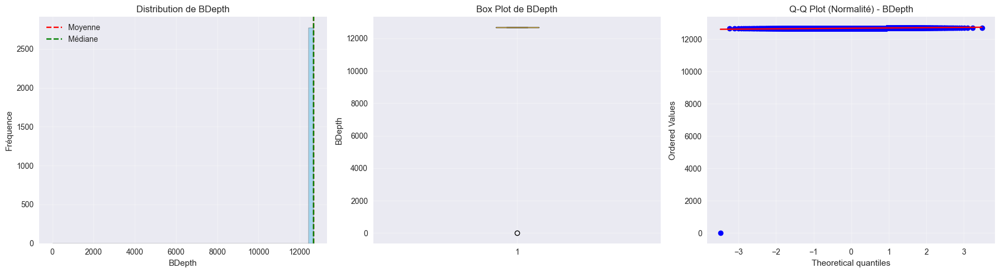


🎯 ANALYSE DE LA VARIABLE CIBLE: BSize
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 12.246
  • Médiane: 12.250
  • Écart-type: 0.233
  • Min: 0.000
  • Max: 12.250
  • Asymétrie (skewness): -52.669
  • Aplatissement (kurtosis): 2774.000


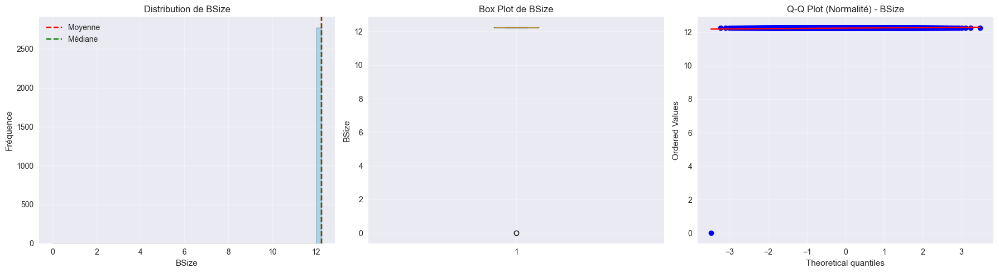


🎯 ANALYSE DE LA VARIABLE CIBLE: MVis
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 9.997
  • Médiane: 10.000
  • Écart-type: 0.190
  • Min: 0.000
  • Max: 10.000
  • Asymétrie (skewness): -52.669
  • Aplatissement (kurtosis): 2774.000


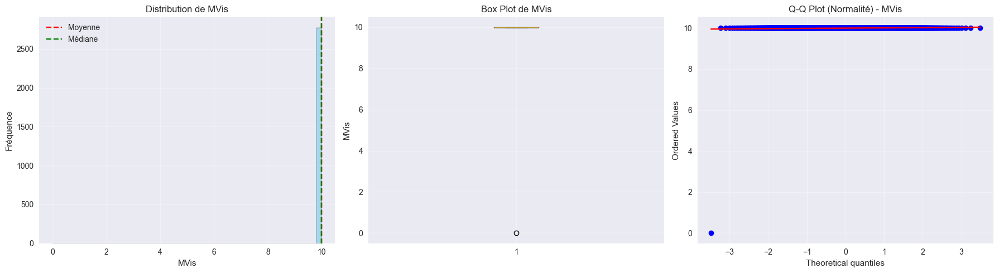


🎯 ANALYSE DE LA VARIABLE CIBLE: FPress
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 6576.632
  • Médiane: 6796.263
  • Écart-type: 1013.484
  • Min: 4693.080
  • Max: 7603.280
  • Asymétrie (skewness): -1.013
  • Aplatissement (kurtosis): -0.292


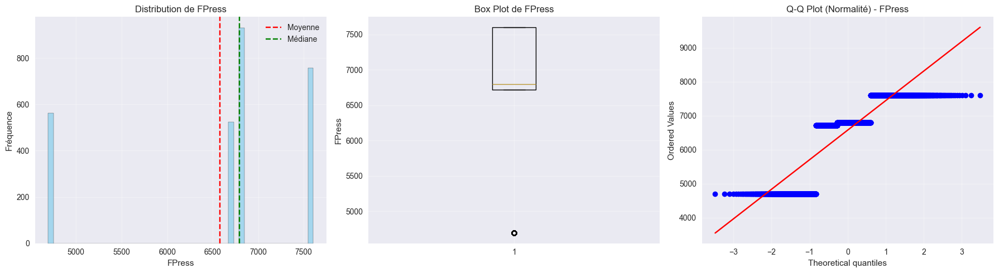


🎯 ANALYSE DE LA VARIABLE CIBLE: DPPress
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 604.870
  • Médiane: 603.701
  • Écart-type: 9.826
  • Min: 592.958
  • Max: 638.064
  • Asymétrie (skewness): 0.864
  • Aplatissement (kurtosis): -0.086


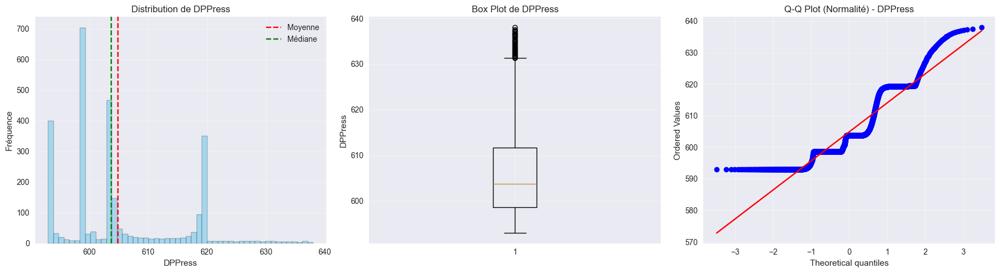


🎯 ANALYSE DE LA VARIABLE CIBLE: CPress
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.000
  • Médiane: 0.000
  • Écart-type: 0.000
  • Min: 0.000
  • Max: 0.000
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


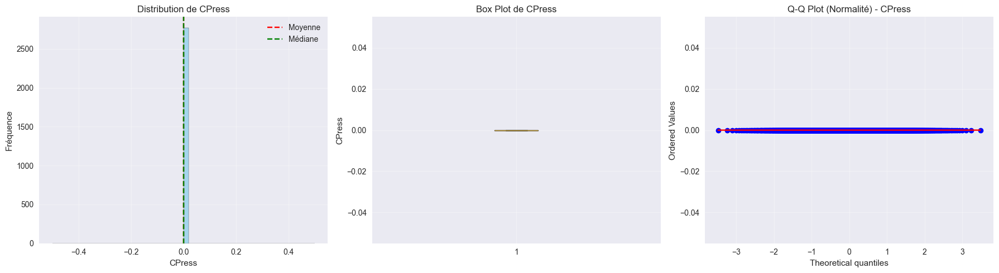


🎯 ANALYSE DE LA VARIABLE CIBLE: FIn
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.574
  • Médiane: 0.574
  • Écart-type: 0.000
  • Min: 0.574
  • Max: 0.575
  • Asymétrie (skewness): 3.724
  • Aplatissement (kurtosis): 14.842


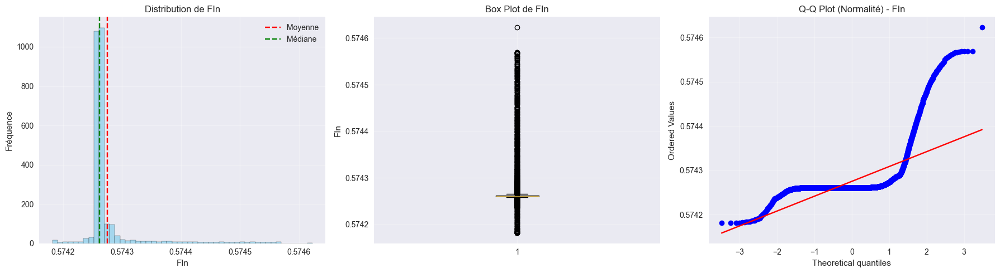


🎯 ANALYSE DE LA VARIABLE CIBLE: FOut
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.576
  • Médiane: 0.574
  • Écart-type: 0.006
  • Min: 0.570
  • Max: 0.616
  • Asymétrie (skewness): 4.727
  • Aplatissement (kurtosis): 22.700


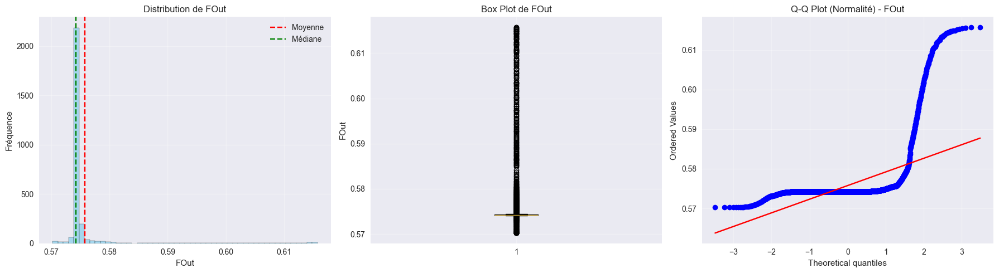


🎯 ANALYSE DE LA VARIABLE CIBLE: MRFlow
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: -0.001
  • Médiane: 0.000
  • Écart-type: 0.006
  • Min: -0.041
  • Max: 0.004
  • Asymétrie (skewness): -4.735
  • Aplatissement (kurtosis): 22.772


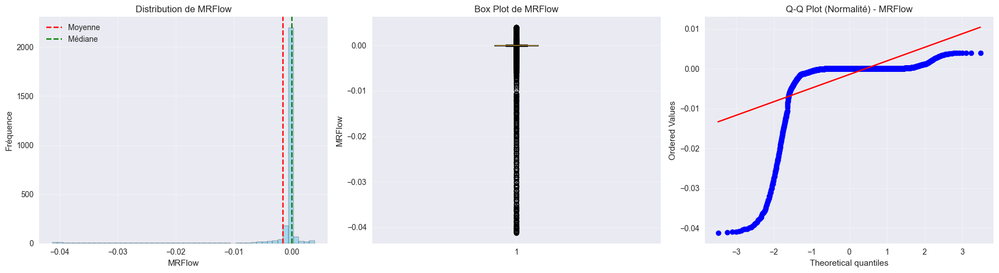


🎯 ANALYSE DE LA VARIABLE CIBLE: ActiveGL
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.000
  • Médiane: 0.000
  • Écart-type: 0.000
  • Min: 0.000
  • Max: 0.000
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


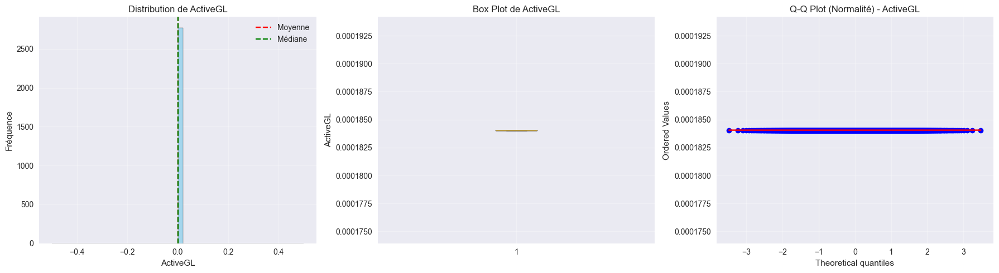


🎯 ANALYSE DE LA VARIABLE CIBLE: ATVolume
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.112
  • Médiane: 0.112
  • Écart-type: 0.000
  • Min: 0.112
  • Max: 0.112
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


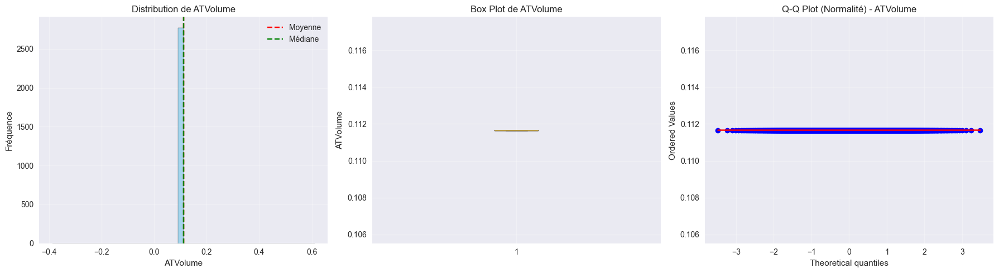


🎯 ANALYSE DE LA VARIABLE CIBLE: RoPen
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 33.842
  • Médiane: 33.851
  • Écart-type: 2.046
  • Min: 21.905
  • Max: 46.655
  • Asymétrie (skewness): 1.379
  • Aplatissement (kurtosis): 16.272


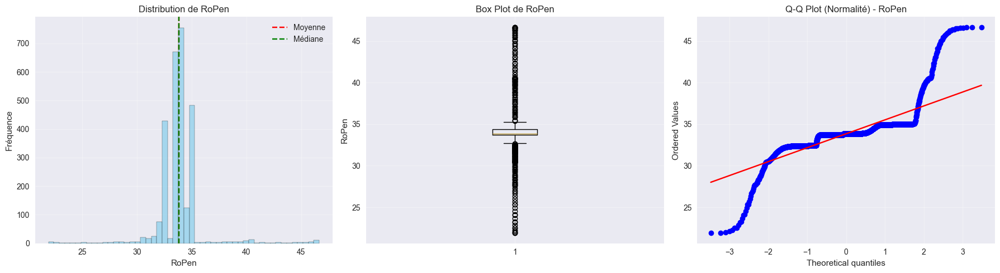


🎯 ANALYSE DE LA VARIABLE CIBLE: WoBit
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 9575.049
  • Médiane: 9705.768
  • Écart-type: 4844.926
  • Min: 3463.426
  • Max: 18936.260
  • Asymétrie (skewness): 0.857
  • Aplatissement (kurtosis): -0.305


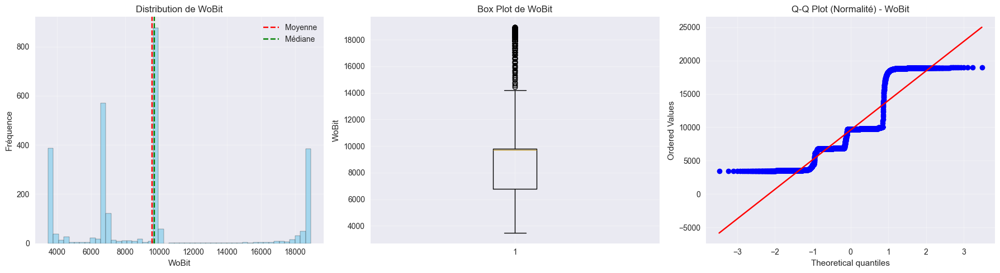


🎯 ANALYSE DE LA VARIABLE CIBLE: HLoad
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 340436.127
  • Médiane: 340308.250
  • Écart-type: 4848.509
  • Min: 331062.900
  • Max: 346546.400
  • Asymétrie (skewness): -0.859
  • Aplatissement (kurtosis): -0.303


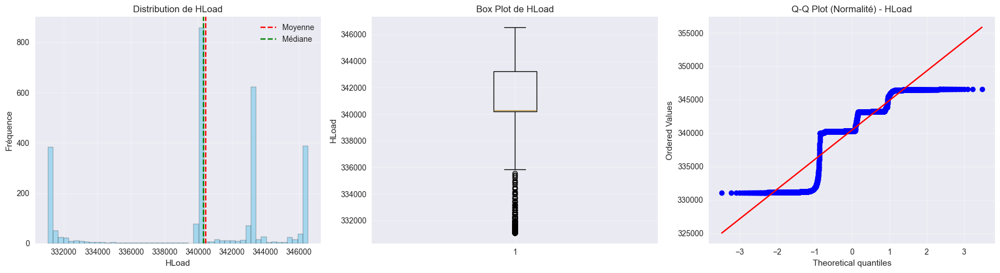


🎯 ANALYSE DE LA VARIABLE CIBLE: WBoPress
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 6950.581
  • Médiane: 6950.315
  • Écart-type: 1.343
  • Min: 6949.128
  • Max: 6984.088
  • Asymétrie (skewness): 5.950
  • Aplatissement (kurtosis): 138.356


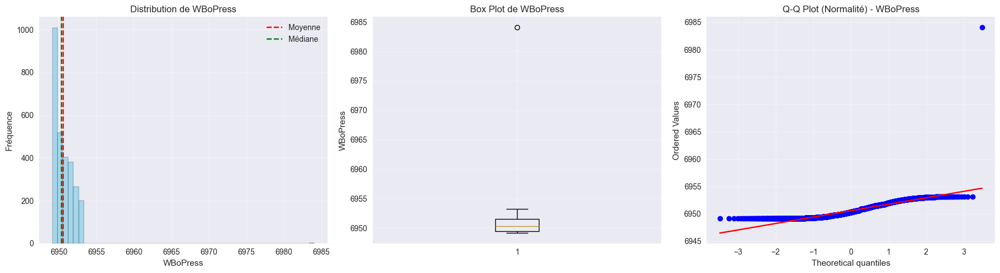


🎯 ANALYSE DE LA VARIABLE CIBLE: BTBR
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 12681.647
  • Médiane: 12681.100
  • Écart-type: 2.280
  • Min: 12678.900
  • Max: 12686.630
  • Asymétrie (skewness): 0.562
  • Aplatissement (kurtosis): -0.930


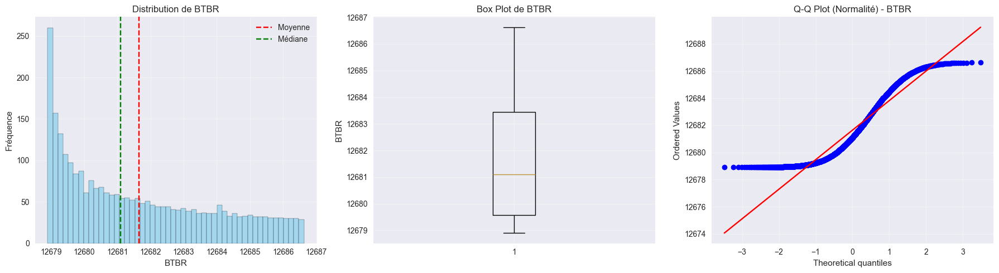


🎯 ANALYSE DE LA VARIABLE CIBLE: MPS1
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 59.687
  • Médiane: 59.687
  • Écart-type: 0.000
  • Min: 59.687
  • Max: 59.687
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


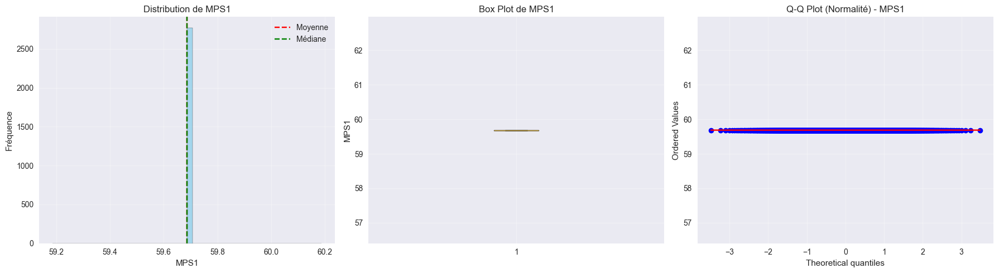


🎯 ANALYSE DE LA VARIABLE CIBLE: MPS2
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 60.174
  • Médiane: 60.174
  • Écart-type: 0.000
  • Min: 60.174
  • Max: 60.174
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


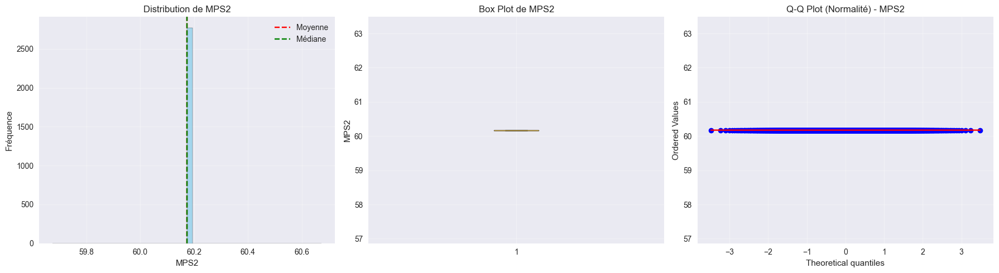


🎯 ANALYSE DE LA VARIABLE CIBLE: MPS3
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 59.660
  • Médiane: 59.660
  • Écart-type: 0.000
  • Min: 59.660
  • Max: 59.660
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


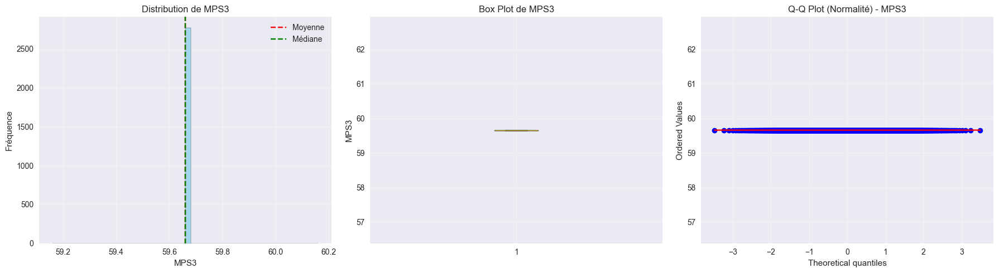


🎯 ANALYSE DE LA VARIABLE CIBLE: AMTD
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 78.545
  • Médiane: 78.545
  • Écart-type: 0.000
  • Min: 78.545
  • Max: 78.545
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


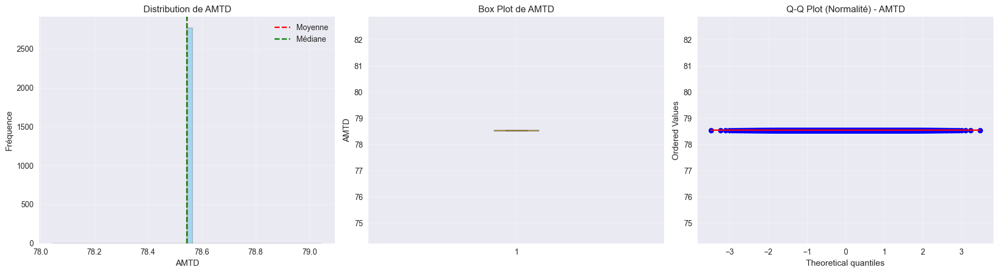


🎯 ANALYSE DE LA VARIABLE CIBLE: ATMPV
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.000
  • Médiane: 0.000
  • Écart-type: 0.000
  • Min: 0.000
  • Max: 0.000
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


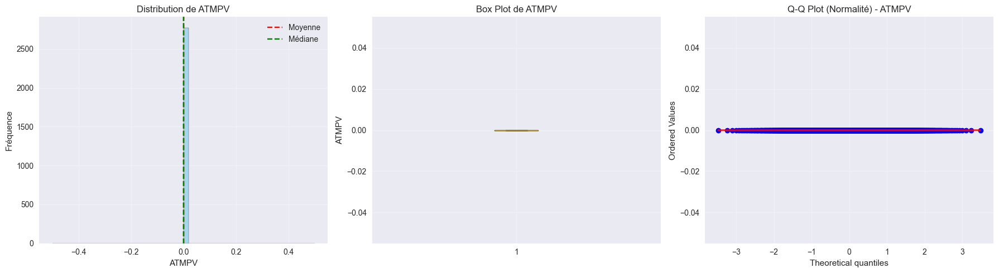


🎯 ANALYSE DE LA VARIABLE CIBLE: ATMYP
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.000
  • Médiane: 0.000
  • Écart-type: 0.000
  • Min: 0.000
  • Max: 0.000
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


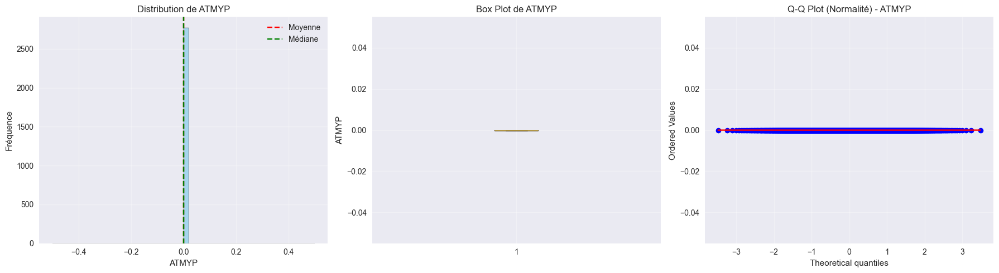


🎯 ANALYSE DE LA VARIABLE CIBLE: STP
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 13798.080
  • Médiane: 13798.080
  • Écart-type: 0.000
  • Min: 13798.080
  • Max: 13798.080
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


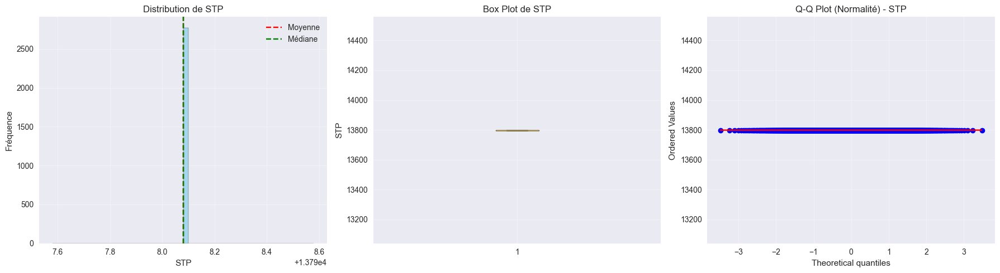


🎯 ANALYSE DE LA VARIABLE CIBLE: WellDepth
Dataset: Formation Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 12681.647
  • Médiane: 12681.100
  • Écart-type: 2.280
  • Min: 12678.900
  • Max: 12686.630
  • Asymétrie (skewness): 0.562
  • Aplatissement (kurtosis): -0.930


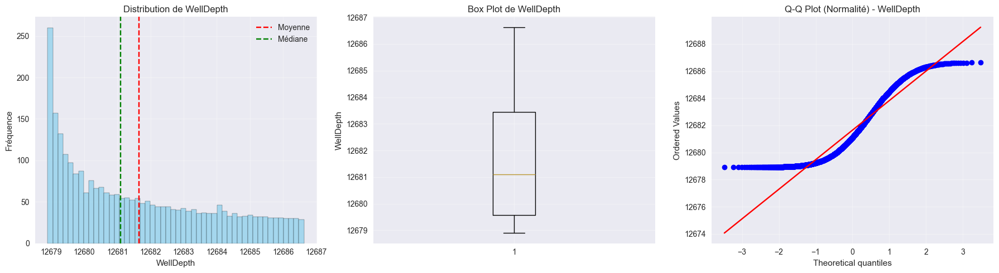


🔹 Analyse automatique du dataset : Kick Detection Data
Colonnes disponibles : ['CircFlow', 'FRate', 'FDensity', 'SMSpeed', 'BDepth', 'BSize', 'MVis', 'FPress', 'DPPress', 'CPress', 'FIn', 'FOut', 'MRFlow', 'ActiveGL', 'ATVolume', 'RoPen', 'WoBit', 'HLoad', 'WBoPress', 'BTBR', 'MPS1', 'MPS2', 'MPS3', 'AMTD', 'ATMPV', 'ATMYP', 'STP', 'WellDepth']
------------------------------------------------------------
📊 Colonnes numériques détectées : ['CircFlow', 'FRate', 'FDensity', 'SMSpeed', 'BDepth', 'BSize', 'MVis', 'FPress', 'DPPress', 'CPress', 'FIn', 'FOut', 'MRFlow', 'ActiveGL', 'ATVolume', 'RoPen', 'WoBit', 'HLoad', 'WBoPress', 'BTBR', 'MPS1', 'MPS2', 'MPS3', 'AMTD', 'ATMPV', 'ATMYP', 'STP', 'WellDepth']
📊 Colonnes catégorielles détectées : []

🎯 ANALYSE DE LA VARIABLE CIBLE: CircFlow
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.955
  • Médiane: 0.953
  • Écart-type: 0.020
  • Min: 0.000
  • Max: 0.966

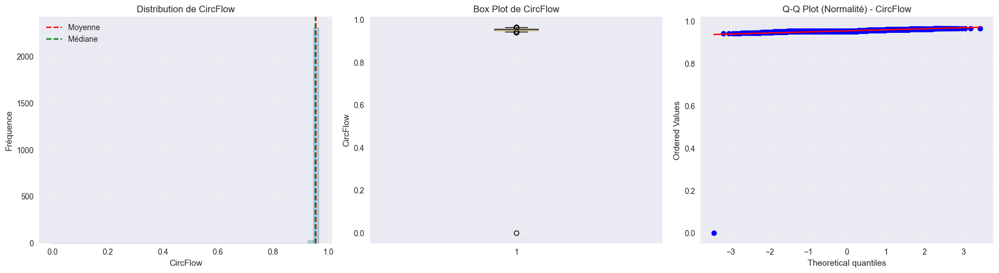


🎯 ANALYSE DE LA VARIABLE CIBLE: FRate
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: -1.634
  • Médiane: -0.955
  • Écart-type: 0.933
  • Min: -3.013
  • Max: 0.000
  • Asymétrie (skewness): -0.697
  • Aplatissement (kurtosis): -1.459


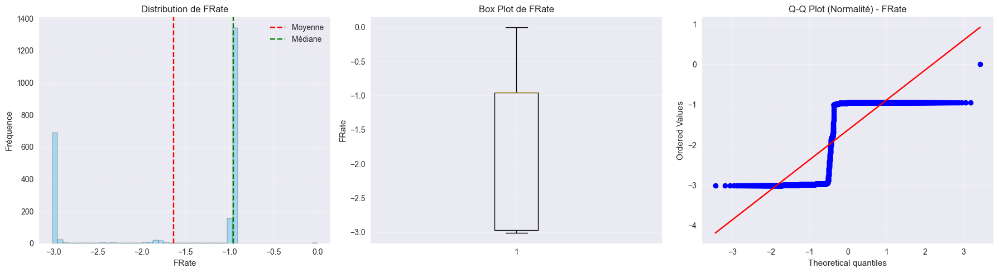


🎯 ANALYSE DE LA VARIABLE CIBLE: FDensity
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 77.010
  • Médiane: 78.547
  • Écart-type: 3.102
  • Min: 0.000
  • Max: 78.547
  • Asymétrie (skewness): -7.579
  • Aplatissement (kurtosis): 162.343


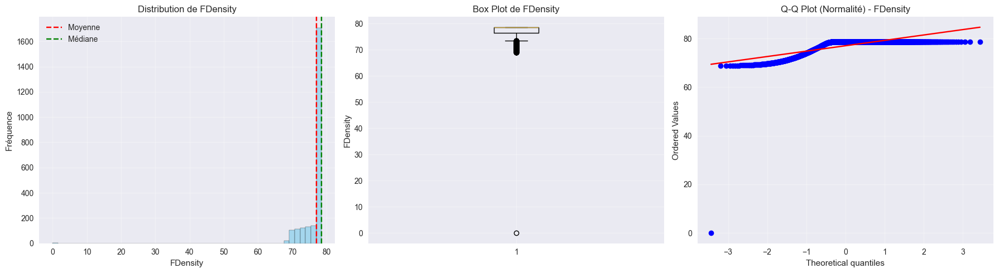


🎯 ANALYSE DE LA VARIABLE CIBLE: SMSpeed
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: -0.030
  • Médiane: -0.005
  • Écart-type: 0.044
  • Min: -0.178
  • Max: 0.000
  • Asymétrie (skewness): -2.048
  • Aplatissement (kurtosis): 3.716


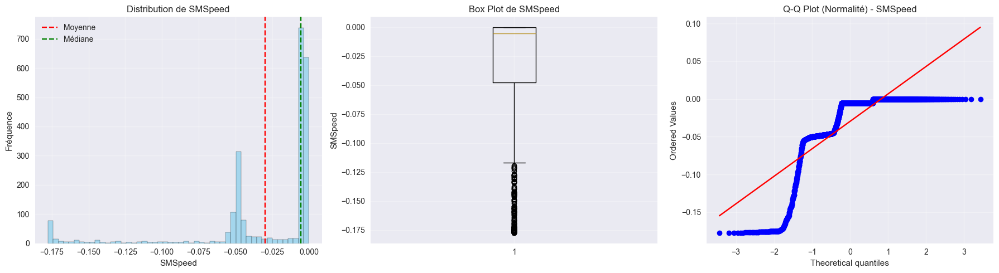


🎯 ANALYSE DE LA VARIABLE CIBLE: BDepth
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 12643.593
  • Médiane: 12645.620
  • Écart-type: 261.784
  • Min: 0.000
  • Max: 12665.350
  • Asymétrie (skewness): -48.270
  • Aplatissement (kurtosis): 2332.355


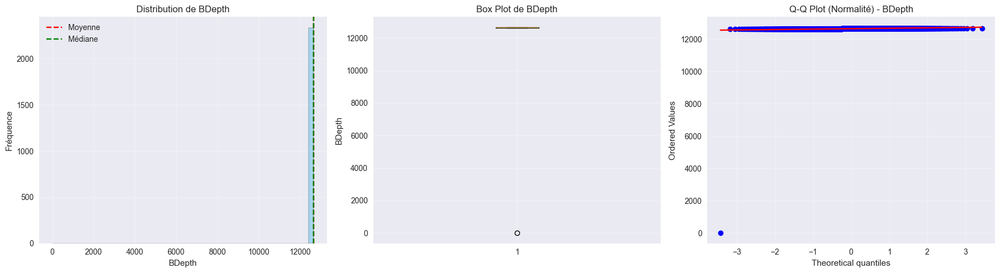


🎯 ANALYSE DE LA VARIABLE CIBLE: BSize
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 12.245
  • Médiane: 12.250
  • Écart-type: 0.253
  • Min: 0.000
  • Max: 12.250
  • Asymétrie (skewness): -48.343
  • Aplatissement (kurtosis): 2337.000


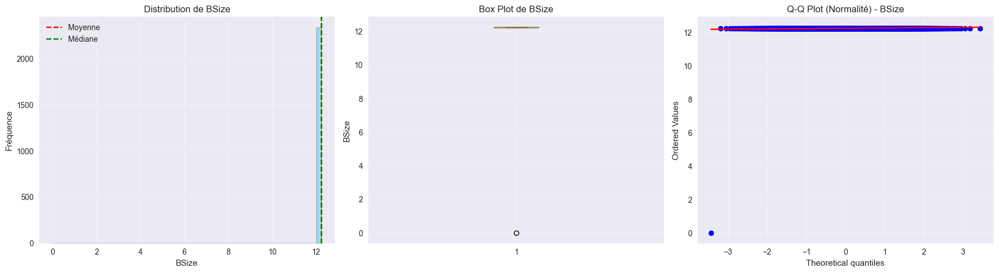


🎯 ANALYSE DE LA VARIABLE CIBLE: MVis
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 9.789
  • Médiane: 10.000
  • Écart-type: 0.418
  • Min: 0.000
  • Max: 10.000
  • Asymétrie (skewness): -6.571
  • Aplatissement (kurtosis): 128.064


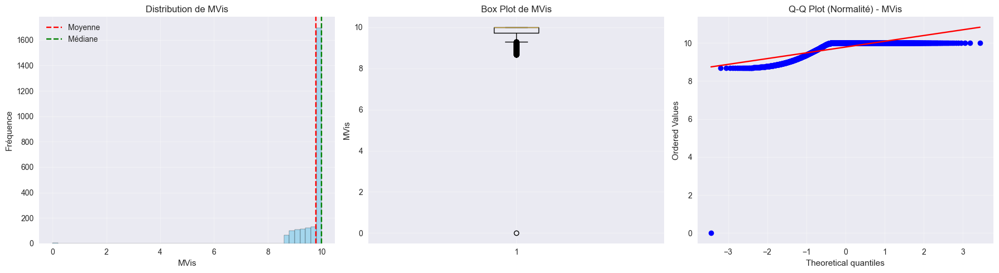


🎯 ANALYSE DE LA VARIABLE CIBLE: FPress
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 7221.058
  • Médiane: 7263.528
  • Écart-type: 858.152
  • Min: 6157.120
  • Max: 8224.046
  • Asymétrie (skewness): -0.038
  • Aplatissement (kurtosis): -1.574


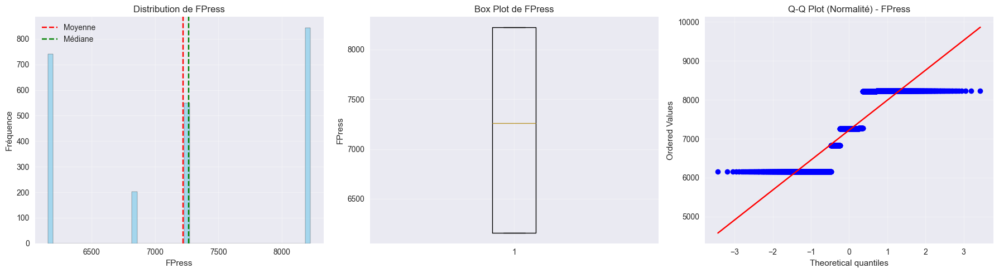


🎯 ANALYSE DE LA VARIABLE CIBLE: DPPress
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 1646.644
  • Médiane: 1683.492
  • Écart-type: 96.259
  • Min: 1302.940
  • Max: 1730.271
  • Asymétrie (skewness): -2.134
  • Aplatissement (kurtosis): 3.584


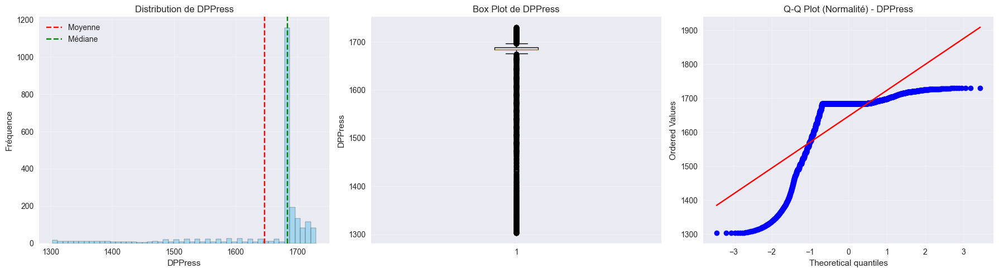


🎯 ANALYSE DE LA VARIABLE CIBLE: CPress
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.000
  • Médiane: 0.000
  • Écart-type: 0.000
  • Min: 0.000
  • Max: 0.000
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


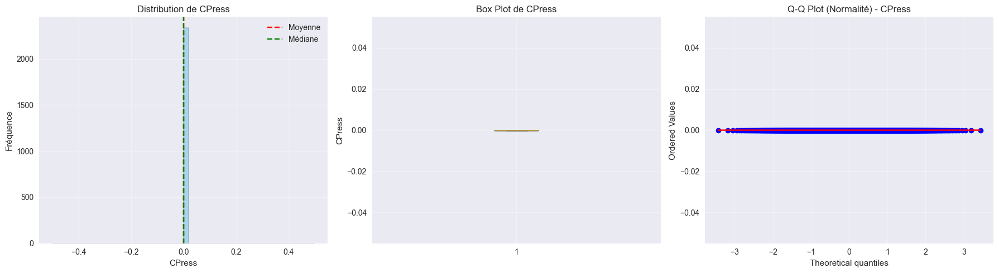


🎯 ANALYSE DE LA VARIABLE CIBLE: FIn
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 0.953
  • Médiane: 0.953
  • Écart-type: 0.000
  • Min: 0.953
  • Max: 0.953
  • Asymétrie (skewness): 0.696
  • Aplatissement (kurtosis): 0.564


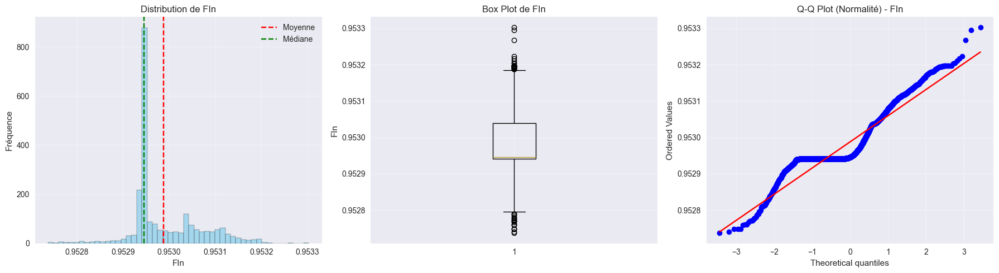


🎯 ANALYSE DE LA VARIABLE CIBLE: FOut
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 1.634
  • Médiane: 0.955
  • Écart-type: 0.932
  • Min: 0.953
  • Max: 3.013
  • Asymétrie (skewness): 0.699
  • Aplatissement (kurtosis): -1.461


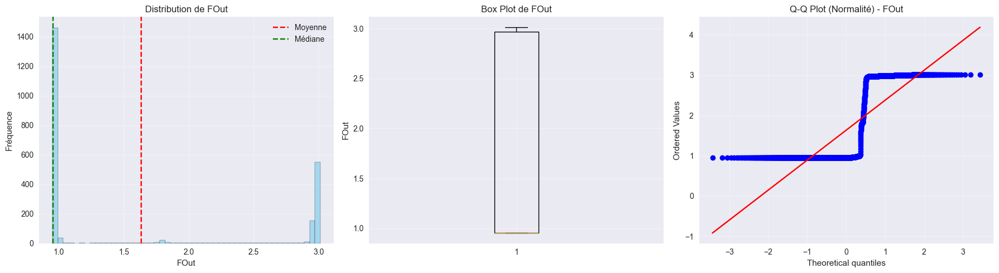


🎯 ANALYSE DE LA VARIABLE CIBLE: MRFlow
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: -0.681
  • Médiane: -0.002
  • Écart-type: 0.932
  • Min: -2.059
  • Max: 0.000
  • Asymétrie (skewness): -0.699
  • Aplatissement (kurtosis): -1.461


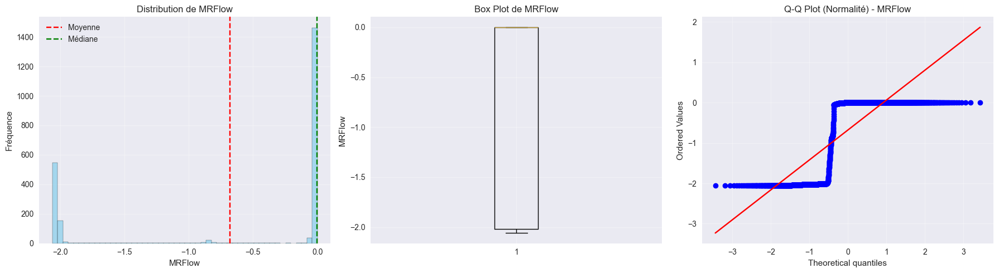


🎯 ANALYSE DE LA VARIABLE CIBLE: ActiveGL
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 9.119
  • Médiane: -0.028
  • Écart-type: 15.675
  • Min: -0.083
  • Max: 55.716
  • Asymétrie (skewness): 1.574
  • Aplatissement (kurtosis): 1.127


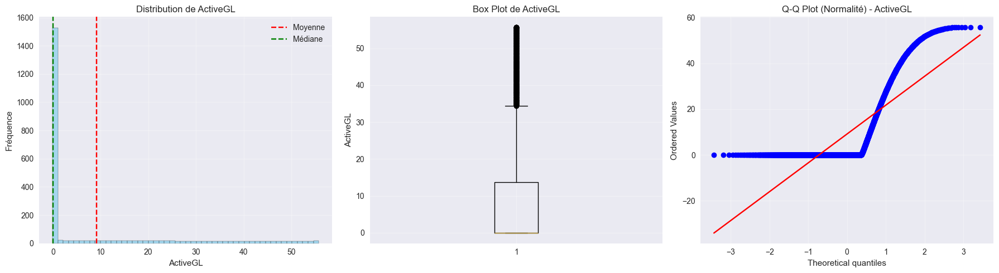


🎯 ANALYSE DE LA VARIABLE CIBLE: ATVolume
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 208.202
  • Médiane: 199.055
  • Écart-type: 15.675
  • Min: 199.000
  • Max: 254.799
  • Asymétrie (skewness): 1.574
  • Aplatissement (kurtosis): 1.127


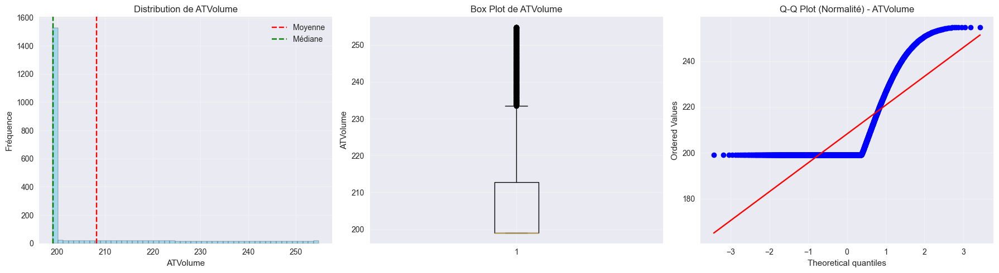


🎯 ANALYSE DE LA VARIABLE CIBLE: RoPen
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 113.682
  • Médiane: 162.385
  • Écart-type: 84.505
  • Min: 1.699
  • Max: 242.797
  • Asymétrie (skewness): -0.070
  • Aplatissement (kurtosis): -1.678


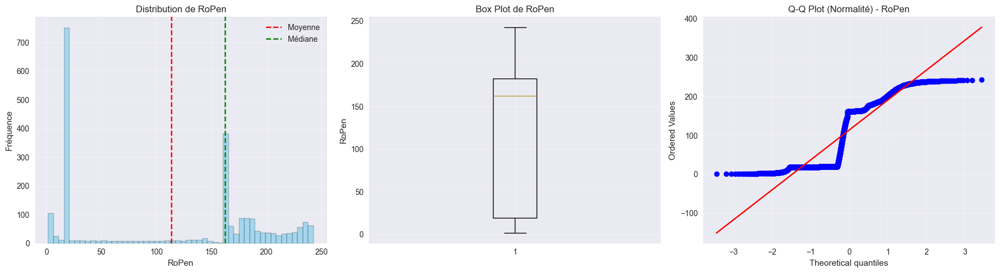


🎯 ANALYSE DE LA VARIABLE CIBLE: WoBit
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 31741.044
  • Médiane: 39665.990
  • Écart-type: 11873.597
  • Min: 1224.802
  • Max: 39820.970
  • Asymétrie (skewness): -1.217
  • Aplatissement (kurtosis): 0.249


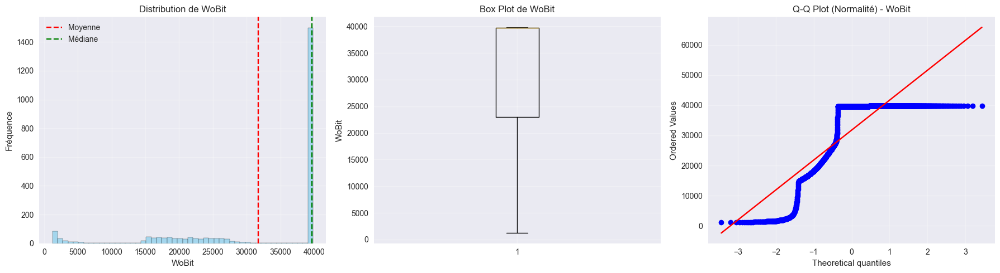


🎯 ANALYSE DE LA VARIABLE CIBLE: HLoad
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 319297.663
  • Médiane: 310921.700
  • Écart-type: 12951.143
  • Min: 310776.200
  • Max: 355228.800
  • Asymétrie (skewness): 1.385
  • Aplatissement (kurtosis): 0.836


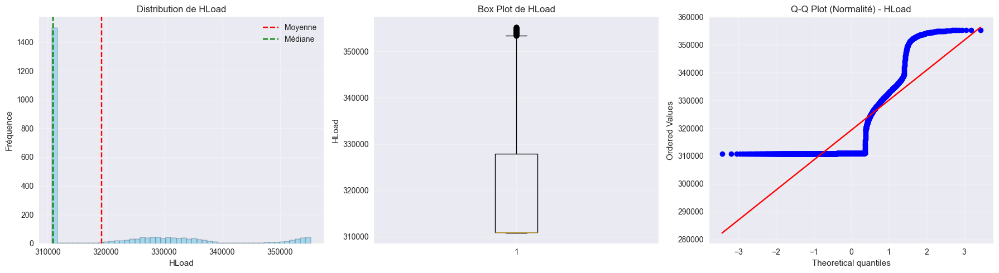


🎯 ANALYSE DE LA VARIABLE CIBLE: WBoPress
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 6937.661
  • Médiane: 6955.514
  • Écart-type: 71.894
  • Min: 6682.449
  • Max: 7060.651
  • Asymétrie (skewness): -1.726
  • Aplatissement (kurtosis): 3.049


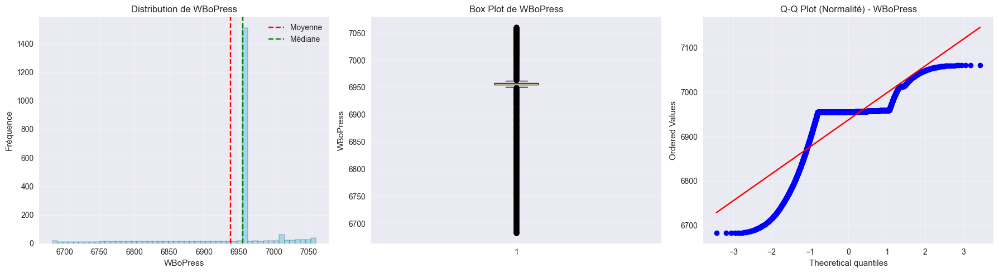


🎯 ANALYSE DE LA VARIABLE CIBLE: BTBR
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 12649.002
  • Médiane: 12645.620
  • Écart-type: 8.251
  • Min: 12641.460
  • Max: 12665.350
  • Asymétrie (skewness): 0.801
  • Aplatissement (kurtosis): -0.803


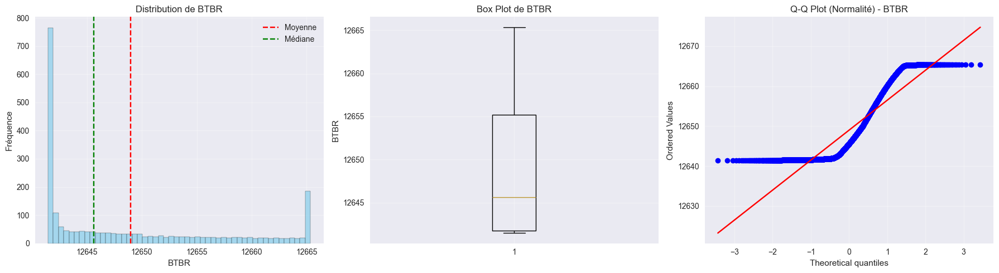


🎯 ANALYSE DE LA VARIABLE CIBLE: MPS1
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 99.046
  • Médiane: 99.046
  • Écart-type: 0.000
  • Min: 99.046
  • Max: 99.046
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


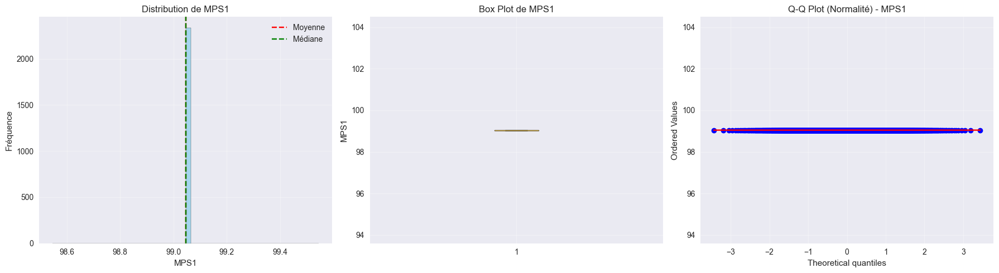


🎯 ANALYSE DE LA VARIABLE CIBLE: MPS2
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 99.046
  • Médiane: 99.046
  • Écart-type: 0.000
  • Min: 99.046
  • Max: 99.046
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


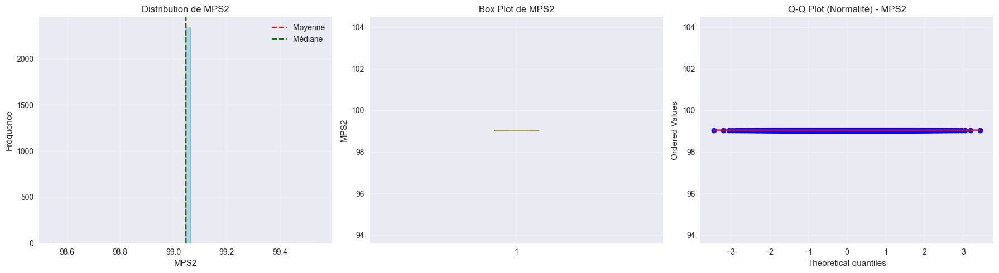


🎯 ANALYSE DE LA VARIABLE CIBLE: MPS3
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 59.660
  • Médiane: 59.660
  • Écart-type: 0.000
  • Min: 59.660
  • Max: 59.660
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


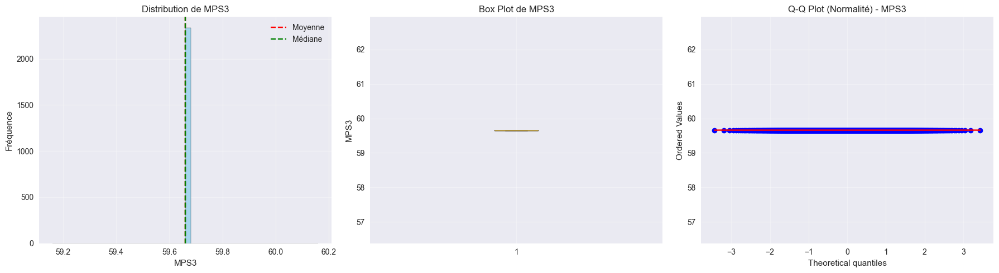


🎯 ANALYSE DE LA VARIABLE CIBLE: AMTD
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 78.545
  • Médiane: 78.545
  • Écart-type: 0.000
  • Min: 78.545
  • Max: 78.545
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


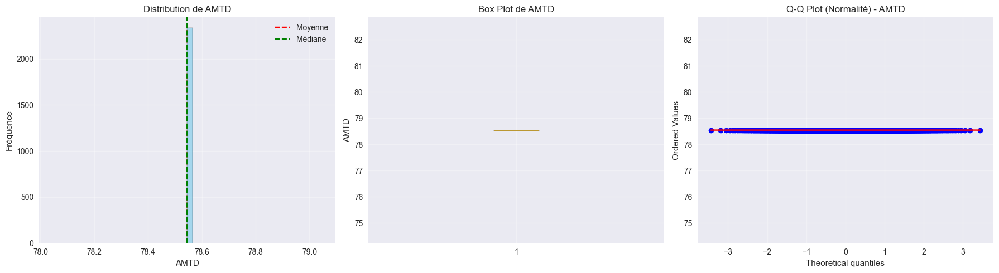


🎯 ANALYSE DE LA VARIABLE CIBLE: ATMPV
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 10.000
  • Médiane: 10.000
  • Écart-type: 0.000
  • Min: 10.000
  • Max: 10.000
  • Asymétrie (skewness): 0.626
  • Aplatissement (kurtosis): -0.905


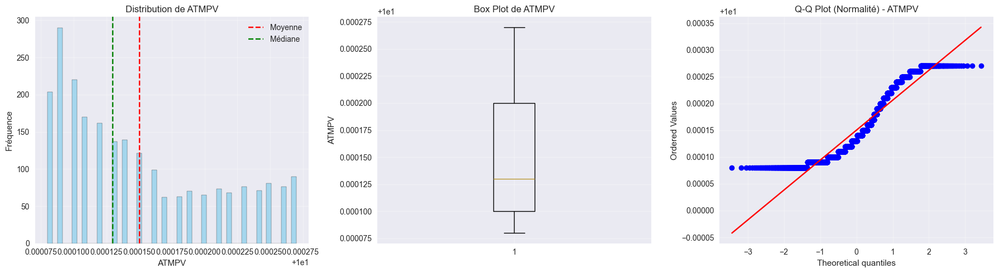


🎯 ANALYSE DE LA VARIABLE CIBLE: ATMYP
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 20.000
  • Médiane: 20.000
  • Écart-type: 0.000
  • Min: 20.000
  • Max: 20.000
  • Asymétrie (skewness): 0.644
  • Aplatissement (kurtosis): -0.885


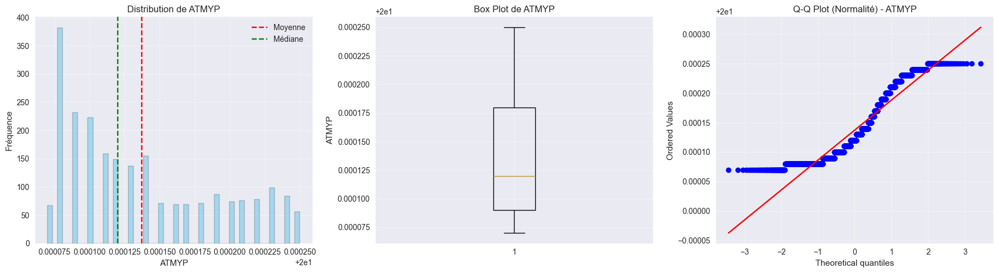


🎯 ANALYSE DE LA VARIABLE CIBLE: STP
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 13798.080
  • Médiane: 13798.080
  • Écart-type: 0.000
  • Min: 13798.080
  • Max: 13798.080
  • Asymétrie (skewness): 0.000
  • Aplatissement (kurtosis): 0.000


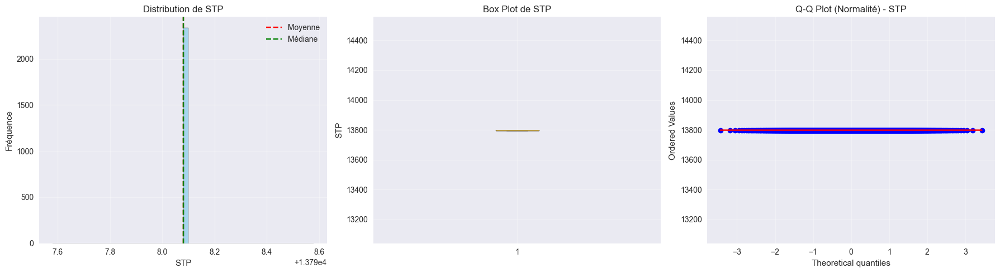


🎯 ANALYSE DE LA VARIABLE CIBLE: WellDepth
Dataset: Kick Detection Data
--------------------------------------------------
📊 Statistiques de la variable cible:
  • Moyenne: 12649.002
  • Médiane: 12645.620
  • Écart-type: 8.251
  • Min: 12641.460
  • Max: 12665.350
  • Asymétrie (skewness): 0.801
  • Aplatissement (kurtosis): -0.803


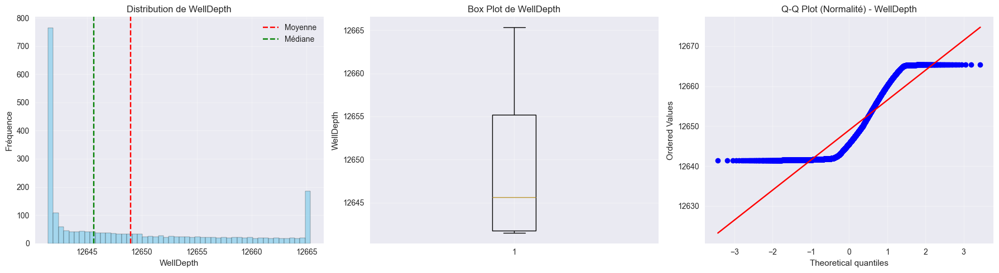

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# 🔹 Fonction d’analyse d’une variable cible
def analyze_target_variable(df, target_col, dataset_name):
    """Analyse une variable cible"""
    if target_col not in df.columns:
        print(f"⚠️ Variable cible '{target_col}' non trouvée dans {dataset_name}")
        return
    
    print(f"\n🎯 ANALYSE DE LA VARIABLE CIBLE: {target_col}")
    print(f"Dataset: {dataset_name}")
    print("-" * 50)
    
    target_data = df[target_col].dropna()
    
    if pd.api.types.is_numeric_dtype(target_data):
        # Variable continue
        print("📊 Statistiques de la variable cible:")
        print(f"  • Moyenne: {target_data.mean():.3f}")
        print(f"  • Médiane: {target_data.median():.3f}")
        print(f"  • Écart-type: {target_data.std():.3f}")
        print(f"  • Min: {target_data.min():.3f}")
        print(f"  • Max: {target_data.max():.3f}")
        print(f"  • Asymétrie (skewness): {target_data.skew():.3f}")
        print(f"  • Aplatissement (kurtosis): {target_data.kurtosis():.3f}")
        
        # Visualisation
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        
        # Histogramme
        axes[0].hist(target_data, bins=50, alpha=0.7, color='skyblue', edgecolor='black')
        axes[0].set_title(f'Distribution de {target_col}')
        axes[0].set_xlabel(target_col)
        axes[0].set_ylabel('Fréquence')
        axes[0].axvline(target_data.mean(), color='red', linestyle='--', label='Moyenne')
        axes[0].axvline(target_data.median(), color='green', linestyle='--', label='Médiane')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)
        
        # Box plot
        axes[1].boxplot(target_data, vert=True)
        axes[1].set_title(f'Box Plot de {target_col}')
        axes[1].set_ylabel(target_col)
        axes[1].grid(True, alpha=0.3)
        
        # Q-Q plot
        stats.probplot(target_data, dist="norm", plot=axes[2])
        axes[2].set_title(f'Q-Q Plot (Normalité) - {target_col}')
        axes[2].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
    else:
        # Variable catégorielle
        value_counts = target_data.value_counts()
        percentages = target_data.value_counts(normalize=True) * 100
        
        print("📊 Distribution de la variable cible:")
        for value, count in value_counts.items():
            print(f"  • {value}: {count} ({percentages[value]:.1f}%)")
        
        # Visualisation
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))
        
        # Bar chart
        value_counts.plot(kind='bar', ax=axes[0], color='skyblue', alpha=0.7)
        axes[0].set_title(f'Distribution de {target_col}')
        axes[0].set_xlabel(target_col)
        axes[0].set_ylabel('Fréquence')
        axes[0].tick_params(axis='x', rotation=45)
        axes[0].grid(True, alpha=0.3)
        
        # Pie chart
        axes[1].pie(value_counts.values, labels=value_counts.index, autopct='%1.1f%%')
        axes[1].set_title(f'Répartition de {target_col}')
        
        plt.tight_layout()
        plt.show()

# 🔹 Fonction pour analyser automatiquement toutes les variables
def analyze_all_targets(df, dataset_name):
    """Analyse automatiquement toutes les variables cibles d'un DataFrame"""
    print(f"\n🔹 Analyse automatique du dataset : {dataset_name}")
    print("Colonnes disponibles :", df.columns.tolist())
    print("-" * 60)
    
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    
    print(f"📊 Colonnes numériques détectées : {numeric_cols}")
    print(f"📊 Colonnes catégorielles détectées : {categorical_cols}")
    
    for col in numeric_cols + categorical_cols:
        analyze_target_variable(df, col, dataset_name)

# 🔹 Exécution
analyze_all_targets(formation_df, "Formation Data")
analyze_all_targets(kick_df, "Kick Detection Data")


In [42]:
# ====================================================================
# 5. Analyse des relations bivariées
# ====================================================================


🔍 ANALYSE BIVARIÉE avec CircFlow
----------------------------------------


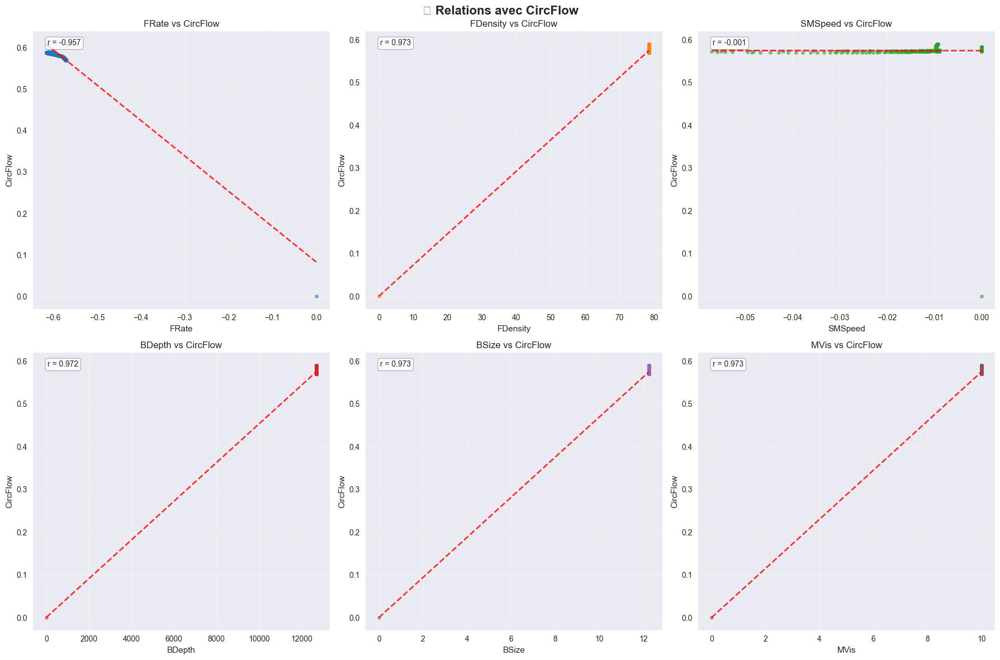


🔍 ANALYSE BIVARIÉE avec FRate
----------------------------------------


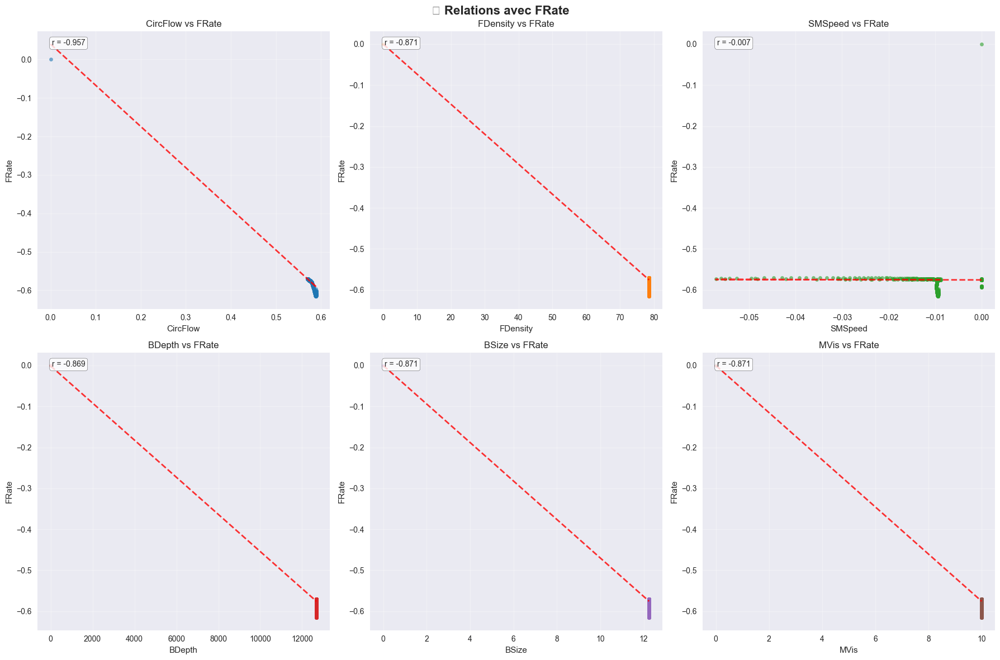


🔍 ANALYSE BIVARIÉE avec FDensity
----------------------------------------


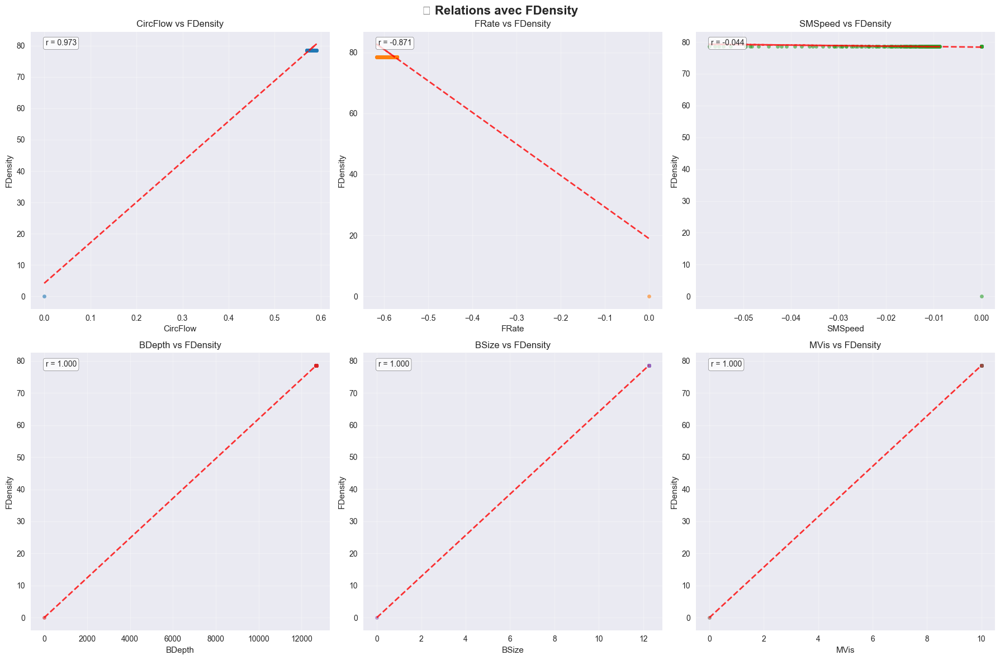


🔍 ANALYSE BIVARIÉE avec SMSpeed
----------------------------------------


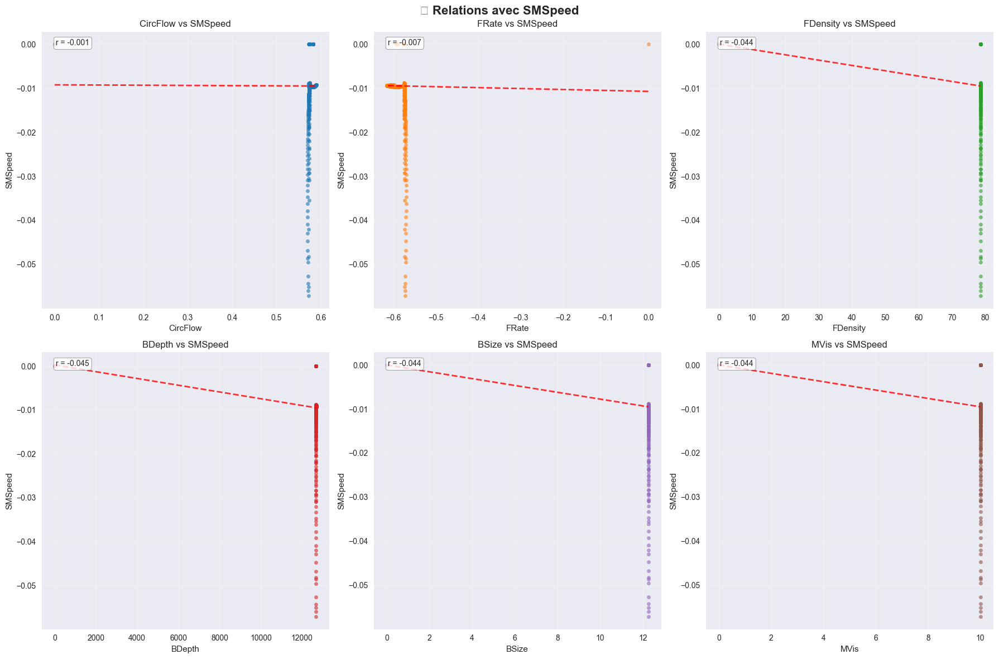


🔍 ANALYSE BIVARIÉE avec BDepth
----------------------------------------


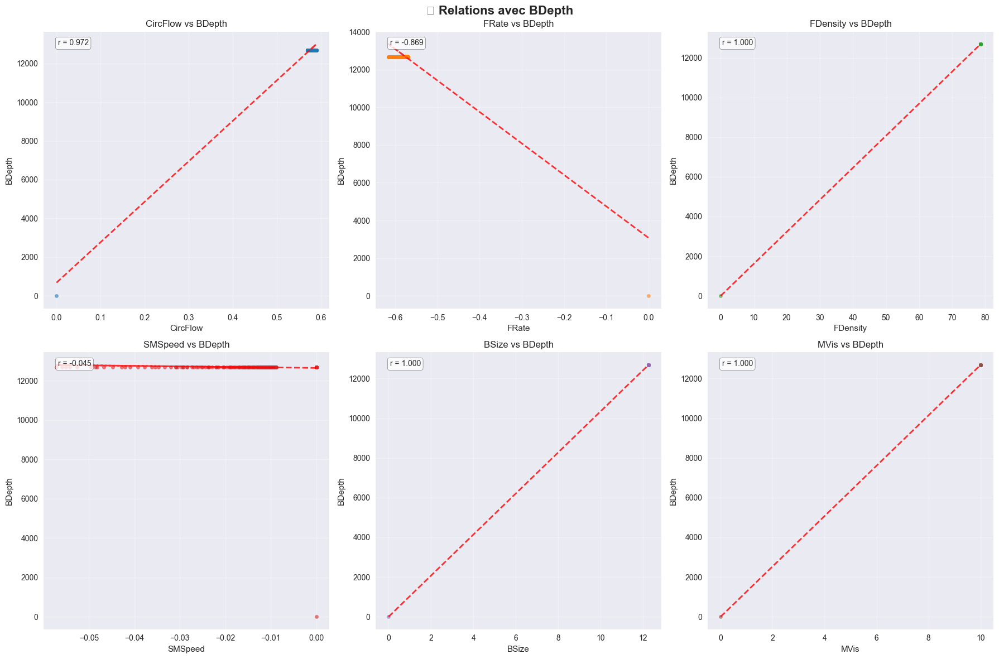


🔍 ANALYSE BIVARIÉE avec BSize
----------------------------------------


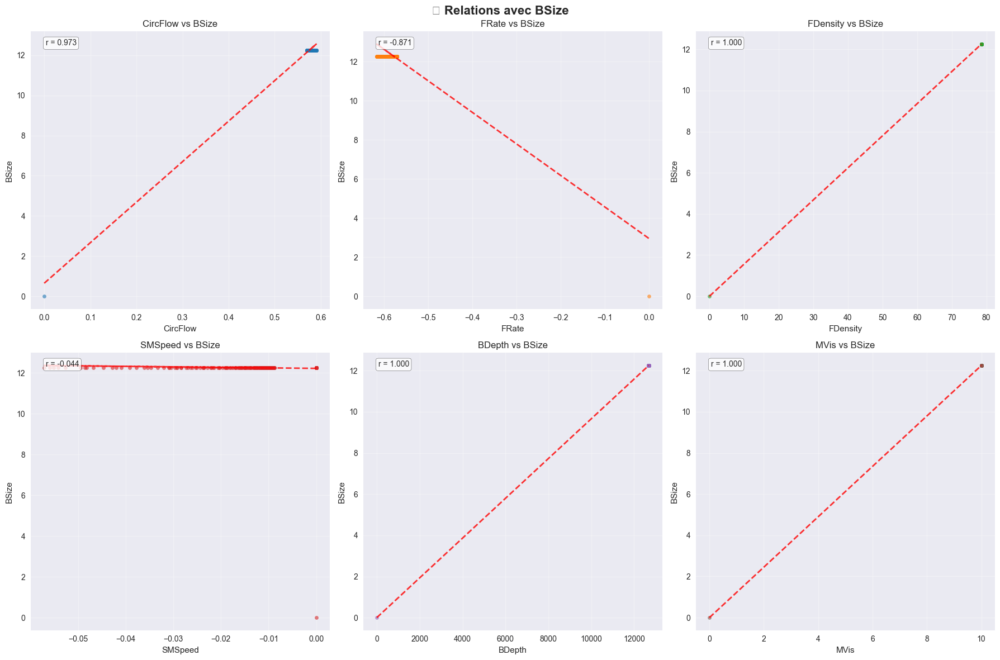


🔍 ANALYSE BIVARIÉE avec MVis
----------------------------------------


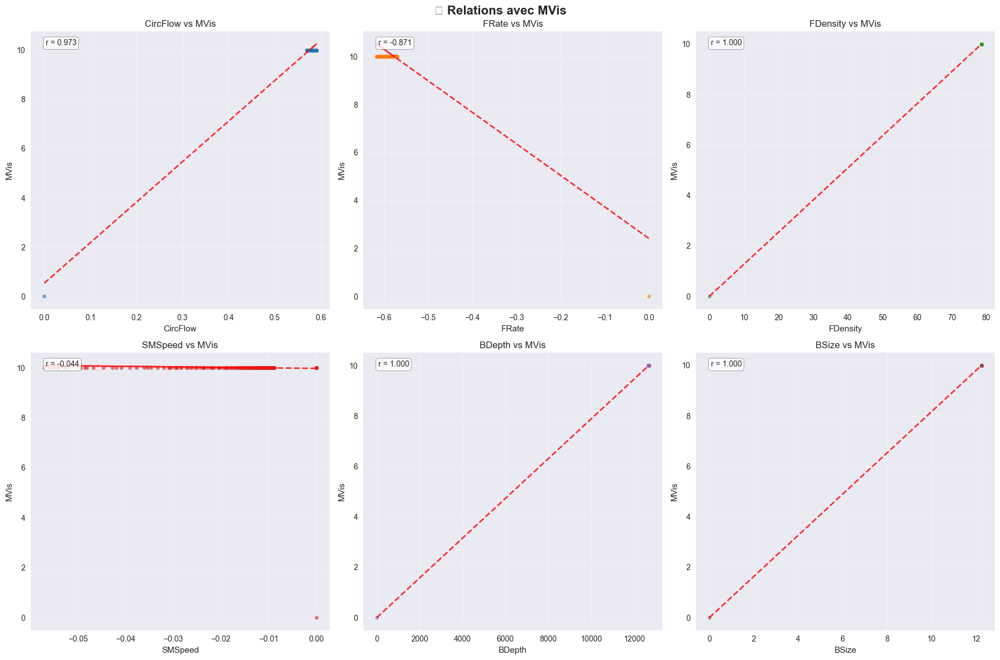


🔍 ANALYSE BIVARIÉE avec FPress
----------------------------------------


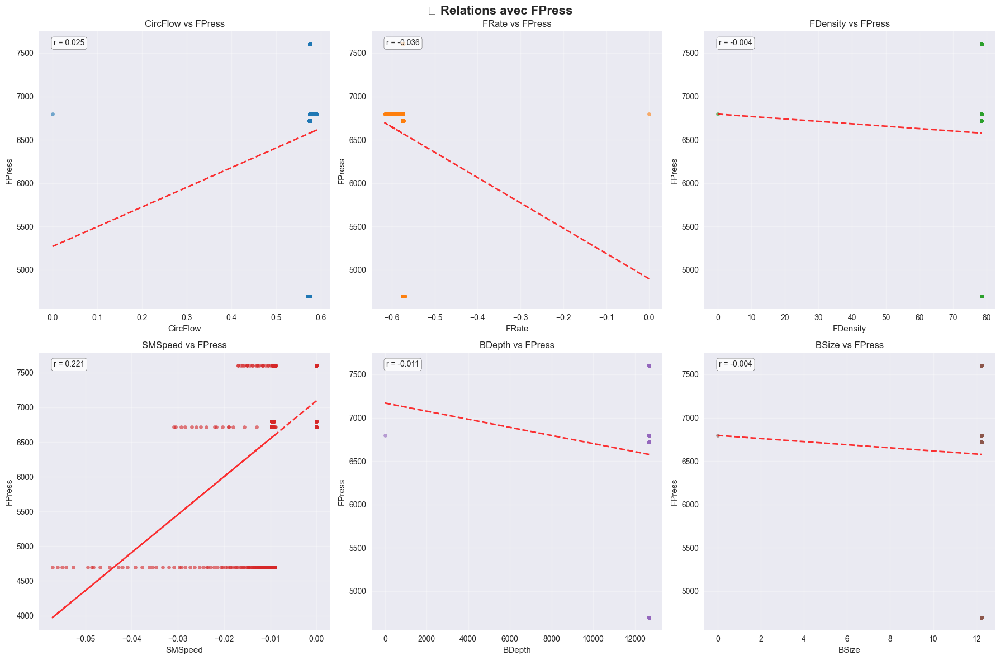


🔍 ANALYSE BIVARIÉE avec DPPress
----------------------------------------


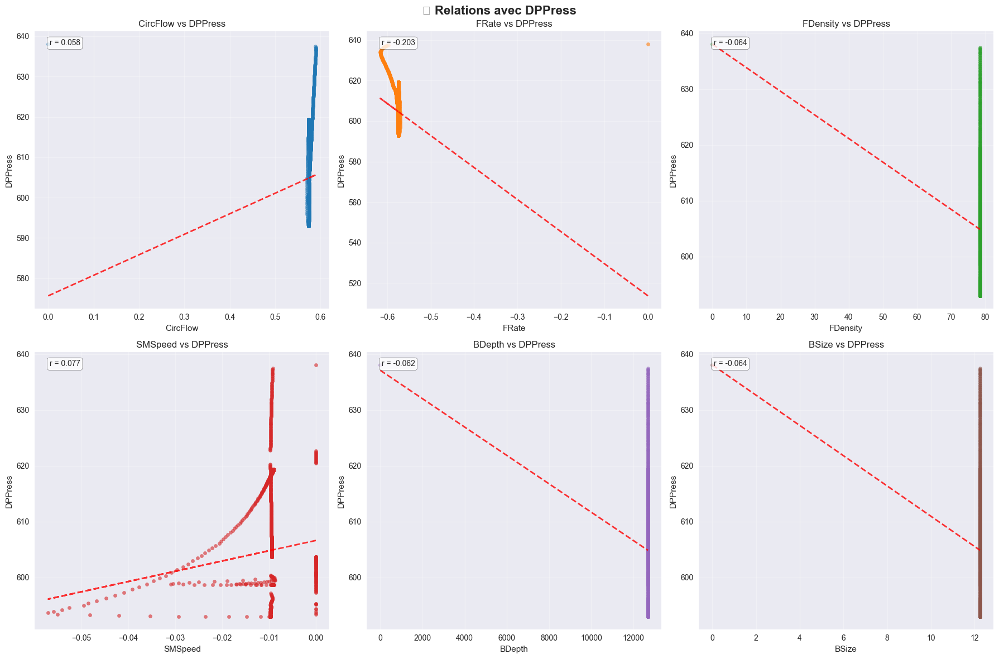


🔍 ANALYSE BIVARIÉE avec CPress
----------------------------------------


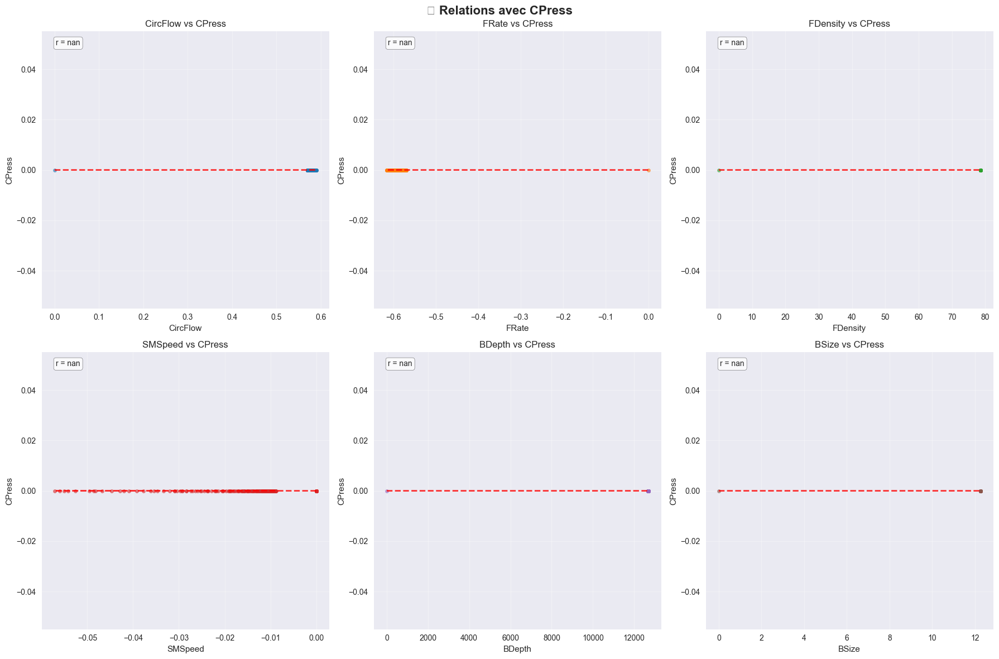


🔍 ANALYSE BIVARIÉE avec FIn
----------------------------------------


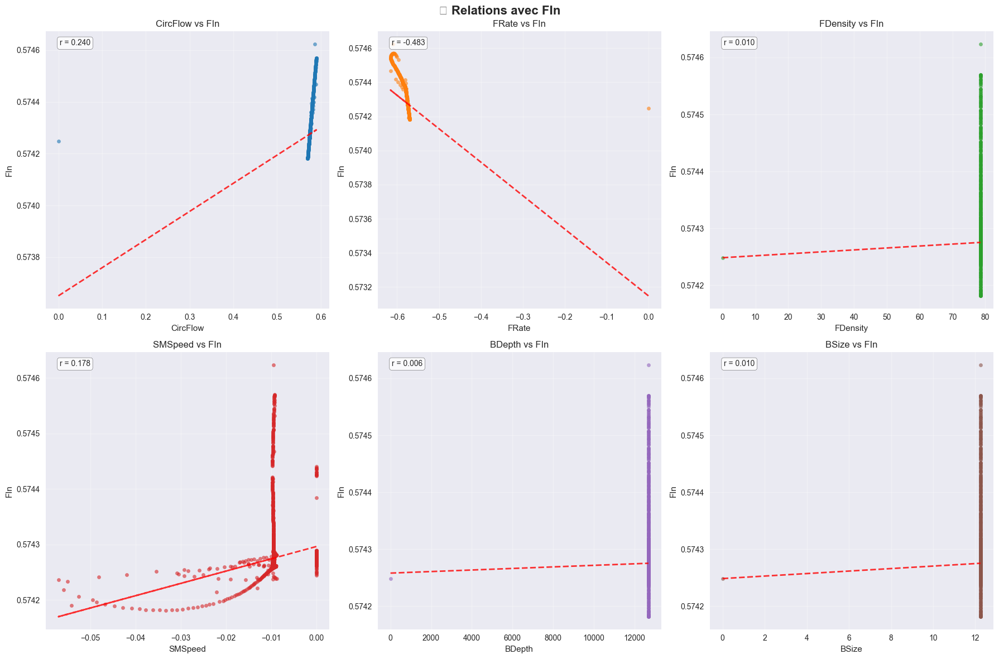


🔍 ANALYSE BIVARIÉE avec FOut
----------------------------------------


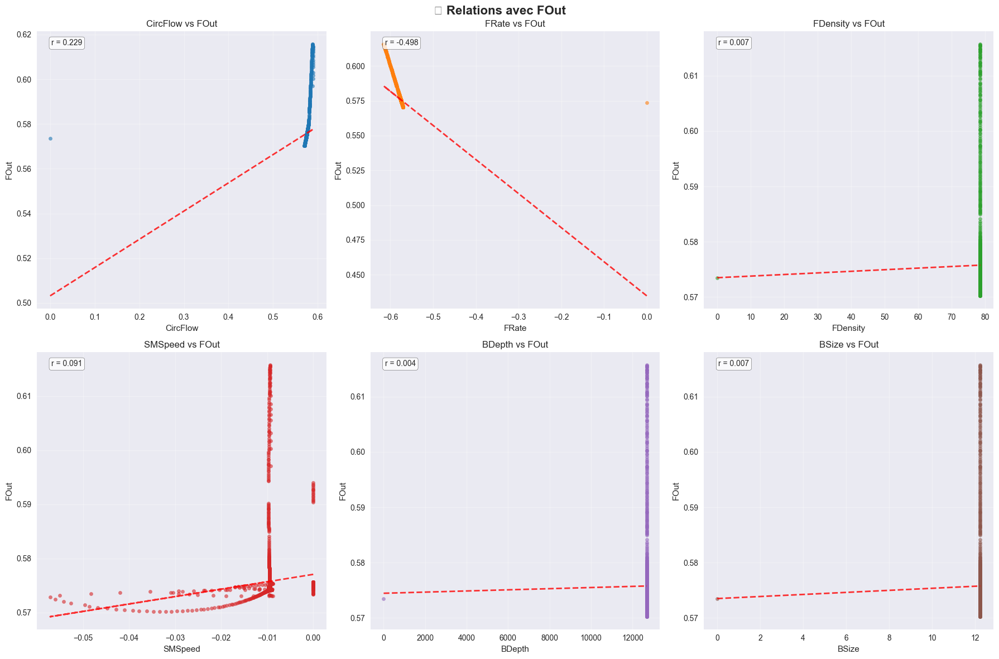


🔍 ANALYSE BIVARIÉE avec MRFlow
----------------------------------------


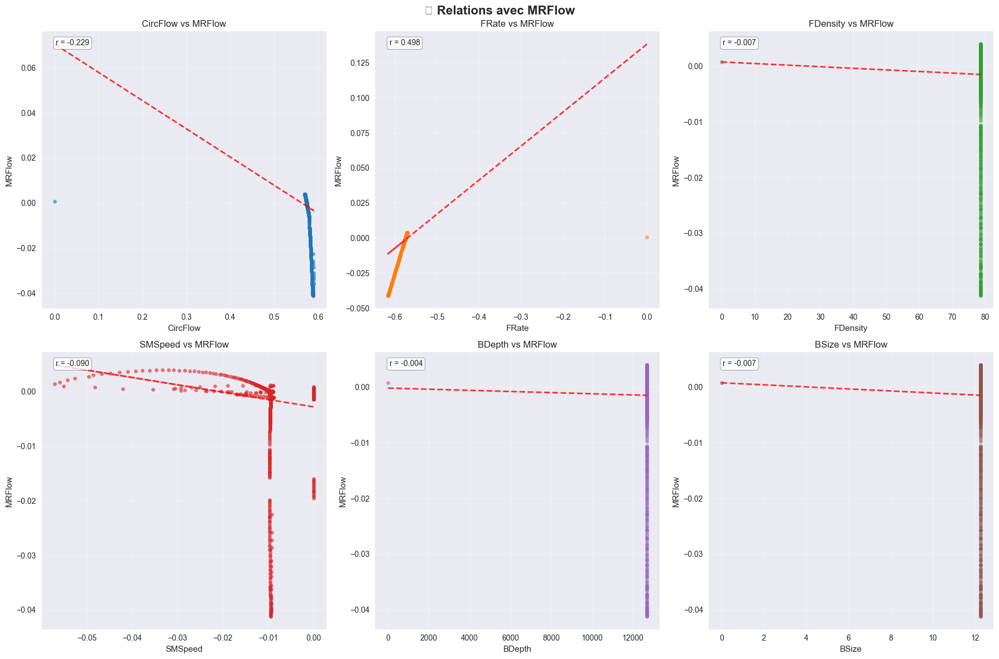


🔍 ANALYSE BIVARIÉE avec ActiveGL
----------------------------------------


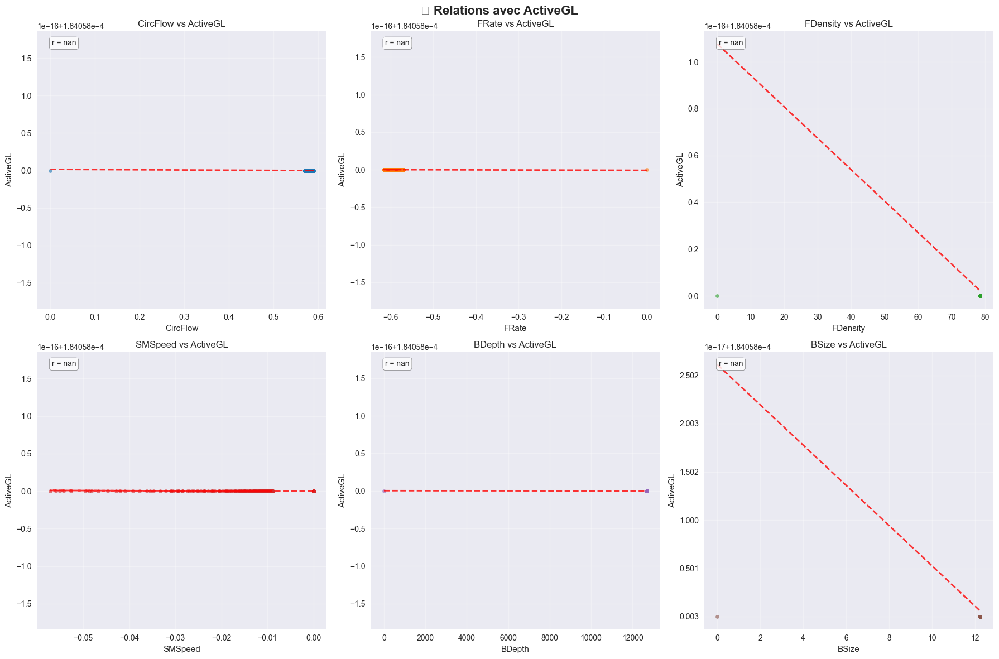


🔍 ANALYSE BIVARIÉE avec ATVolume
----------------------------------------


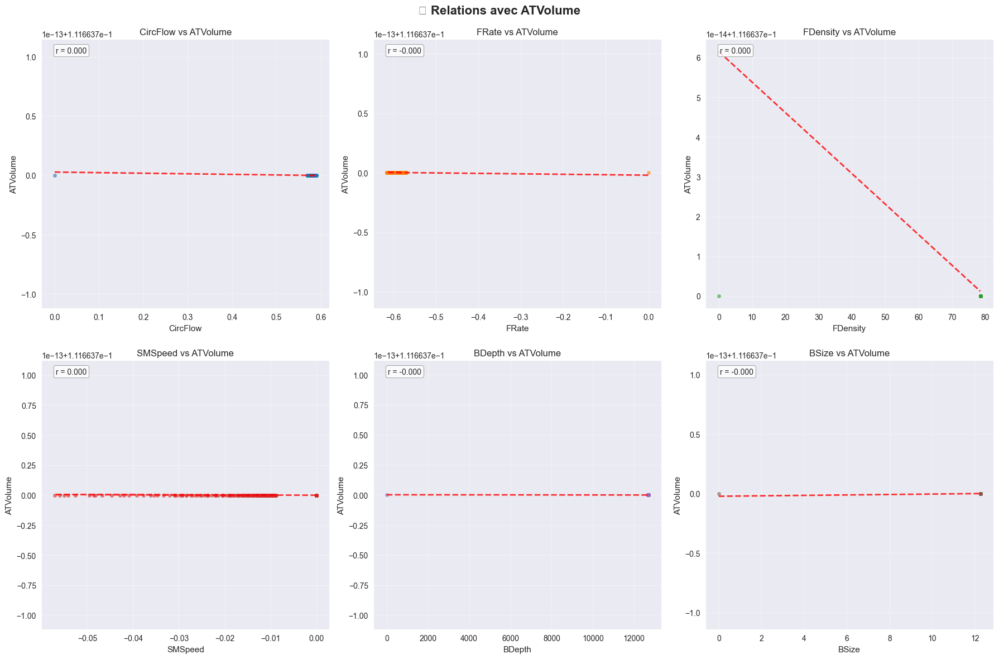


🔍 ANALYSE BIVARIÉE avec RoPen
----------------------------------------


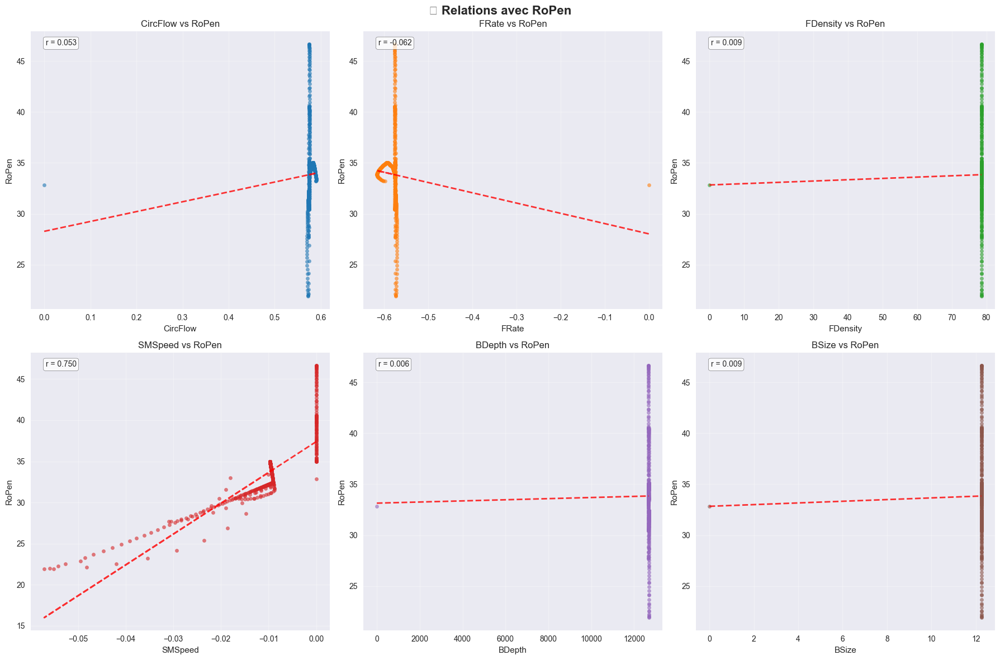


🔍 ANALYSE BIVARIÉE avec WoBit
----------------------------------------


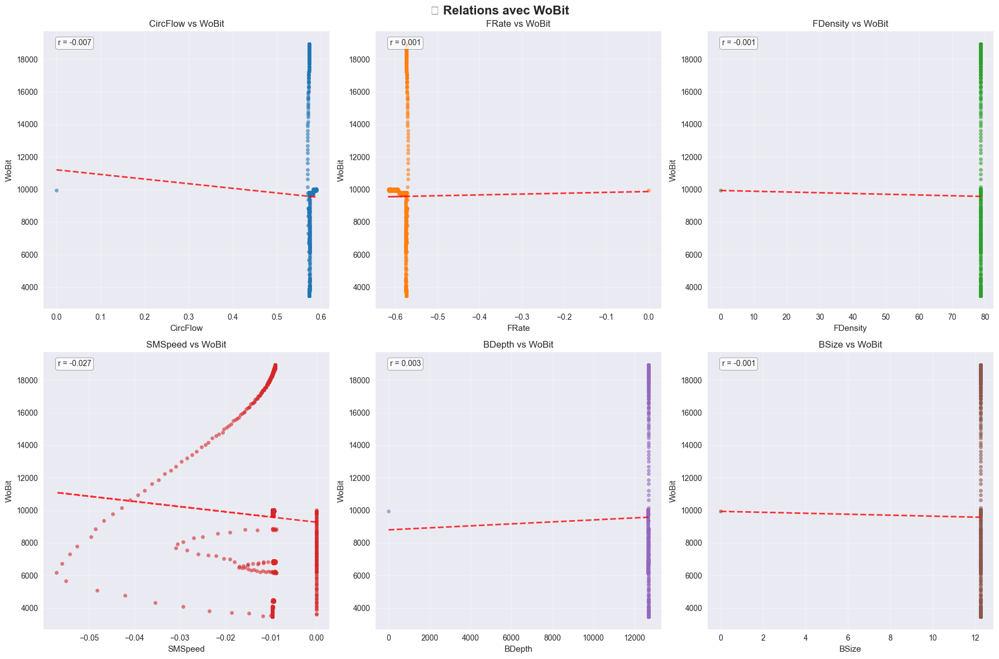


🔍 ANALYSE BIVARIÉE avec HLoad
----------------------------------------


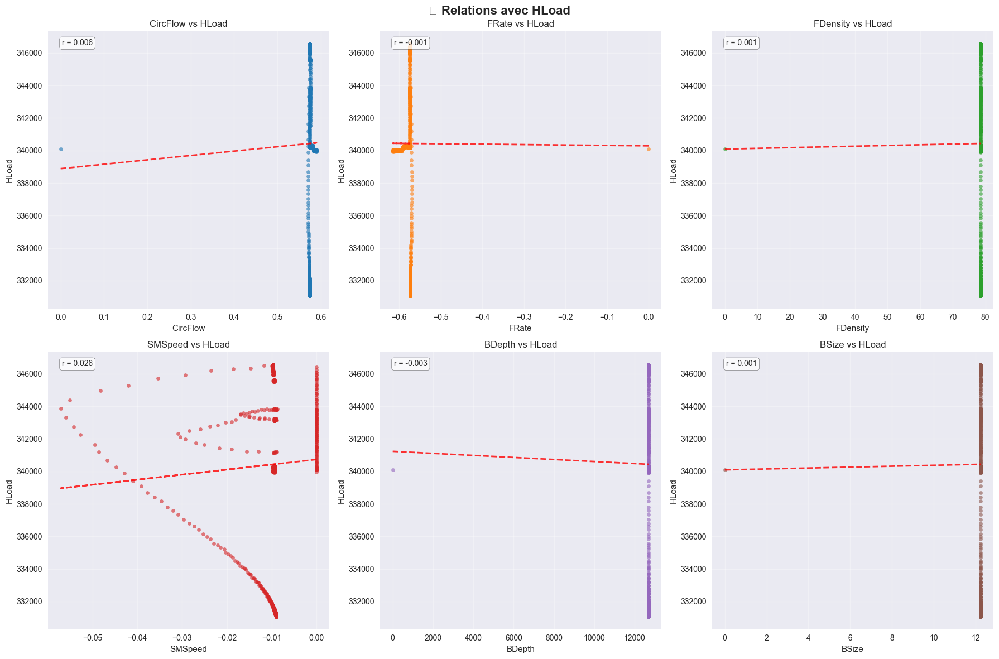


🔍 ANALYSE BIVARIÉE avec WBoPress
----------------------------------------


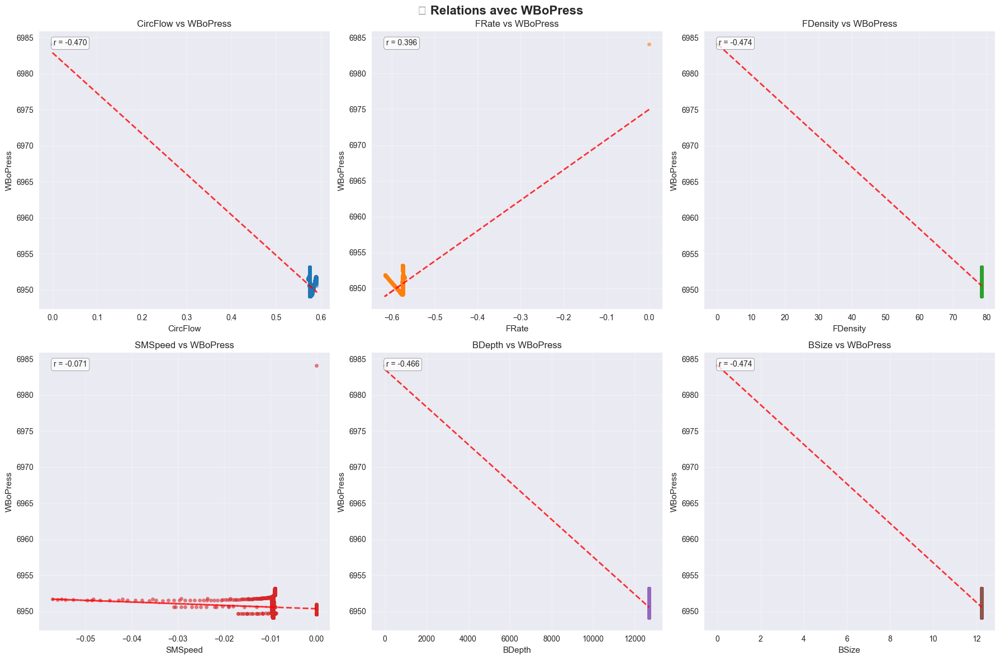


🔍 ANALYSE BIVARIÉE avec BTBR
----------------------------------------


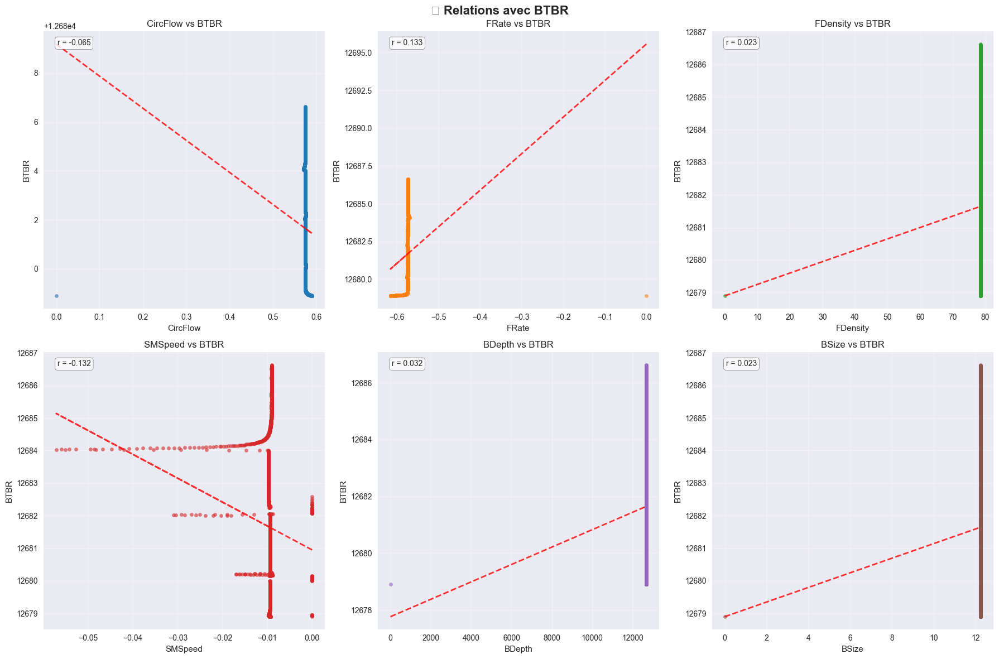


🔍 ANALYSE BIVARIÉE avec MPS1
----------------------------------------


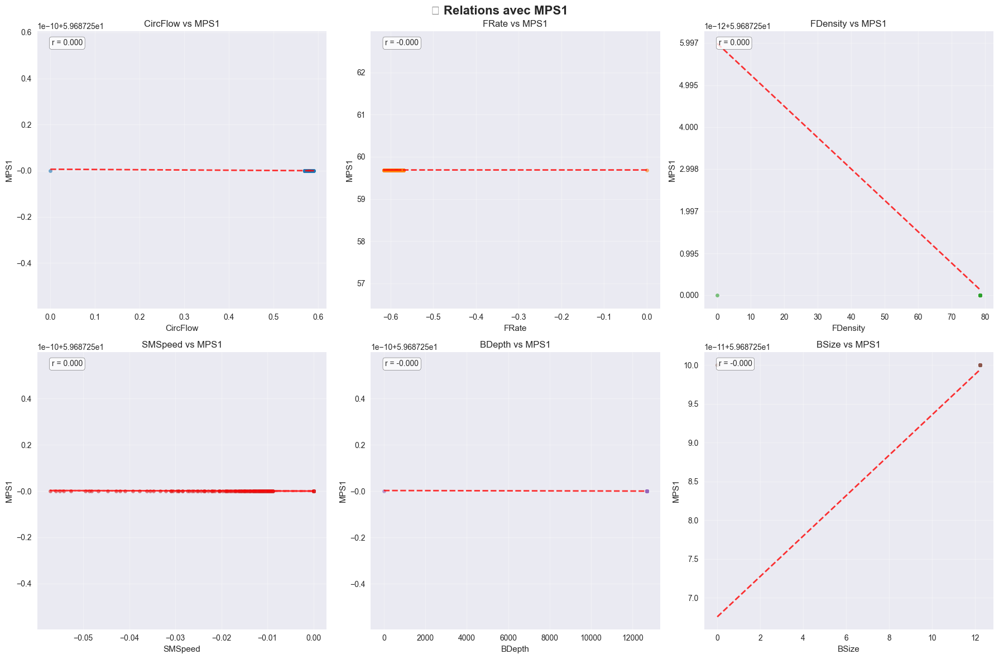


🔍 ANALYSE BIVARIÉE avec MPS2
----------------------------------------


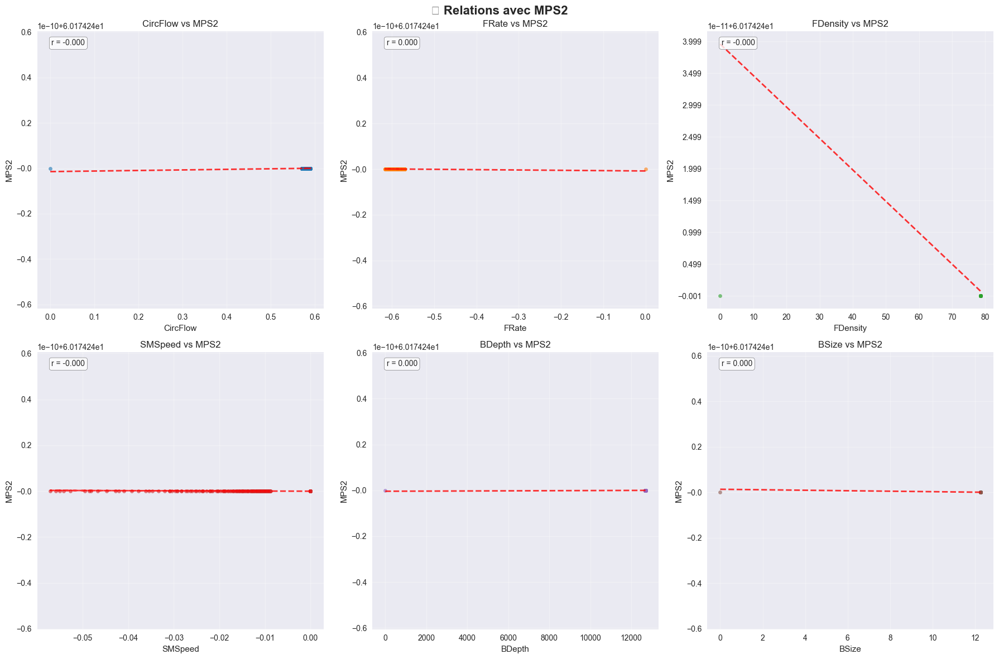


🔍 ANALYSE BIVARIÉE avec MPS3
----------------------------------------


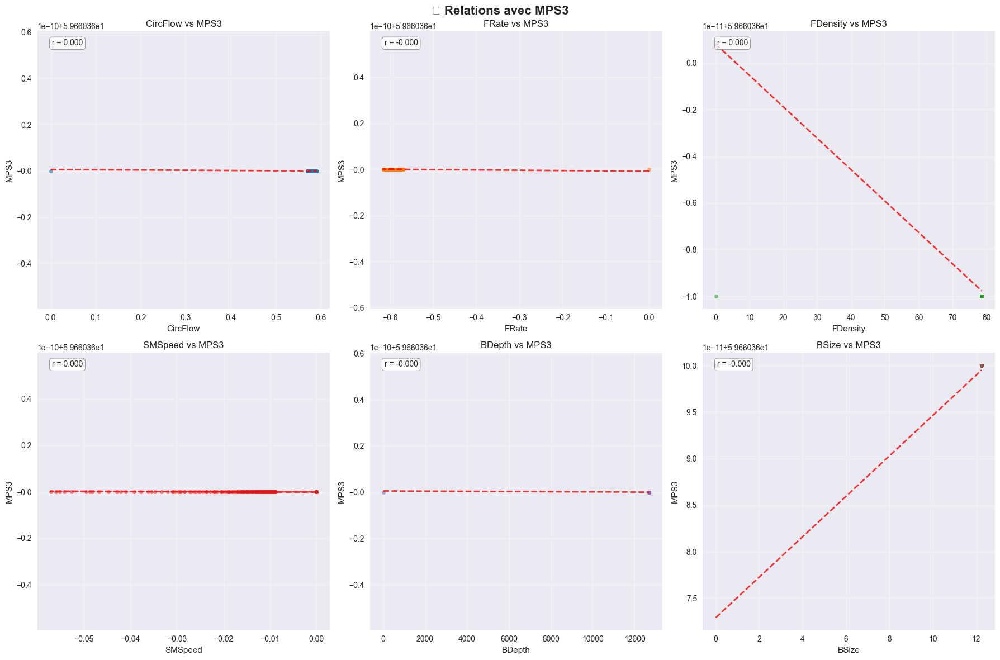


🔍 ANALYSE BIVARIÉE avec AMTD
----------------------------------------


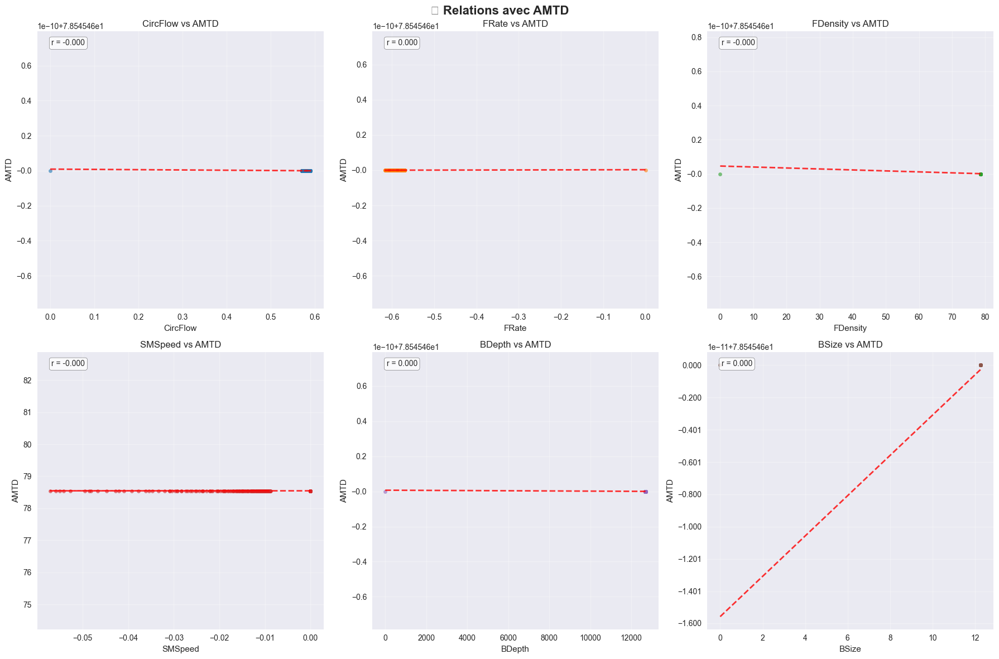


🔍 ANALYSE BIVARIÉE avec ATMPV
----------------------------------------


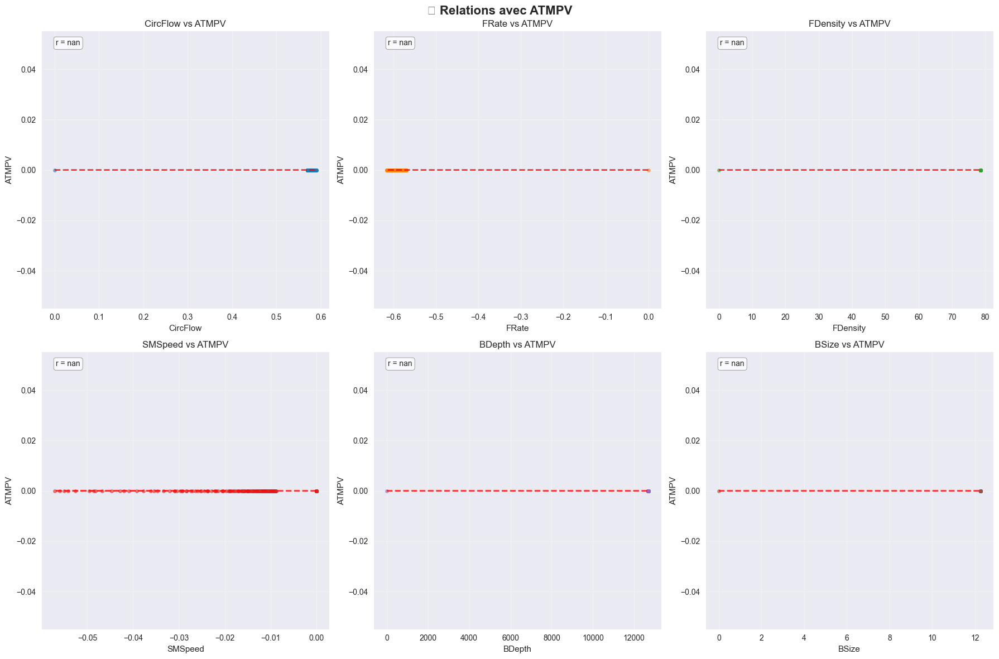


🔍 ANALYSE BIVARIÉE avec ATMYP
----------------------------------------


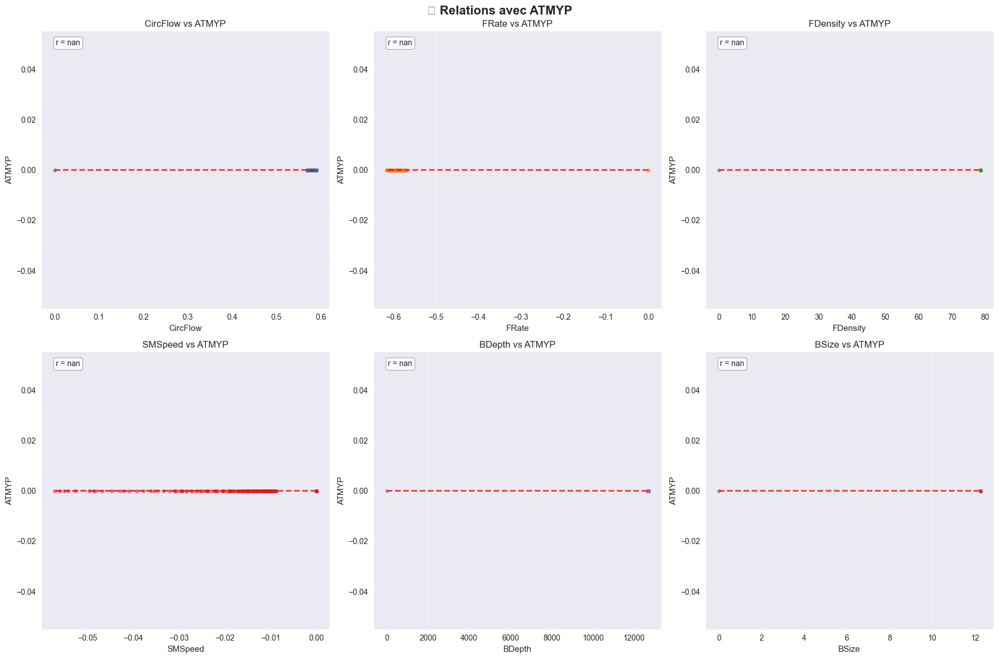


🔍 ANALYSE BIVARIÉE avec STP
----------------------------------------


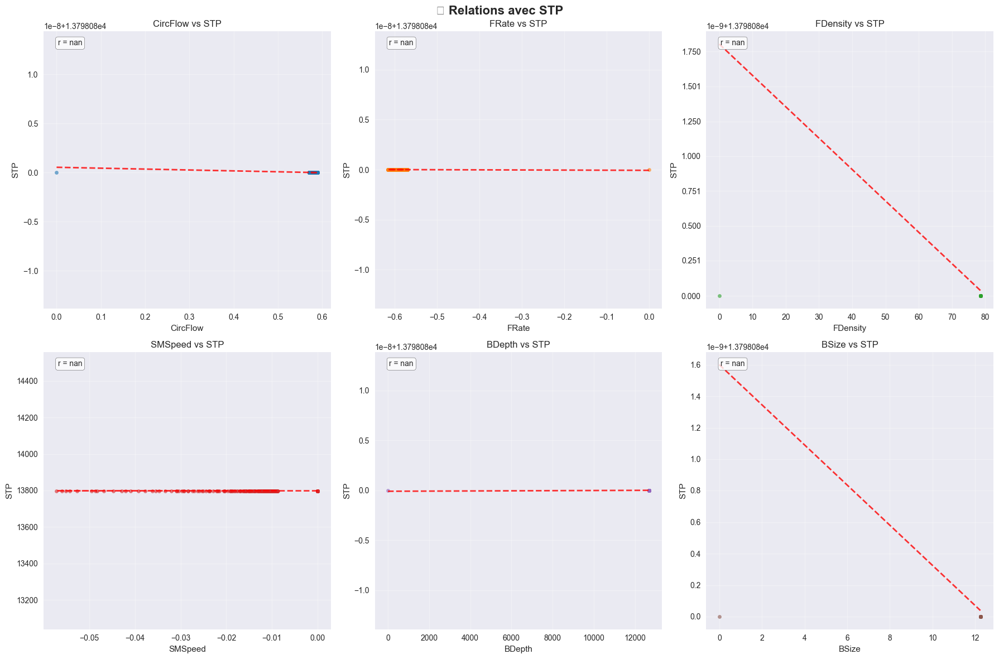


🔍 ANALYSE BIVARIÉE avec WellDepth
----------------------------------------


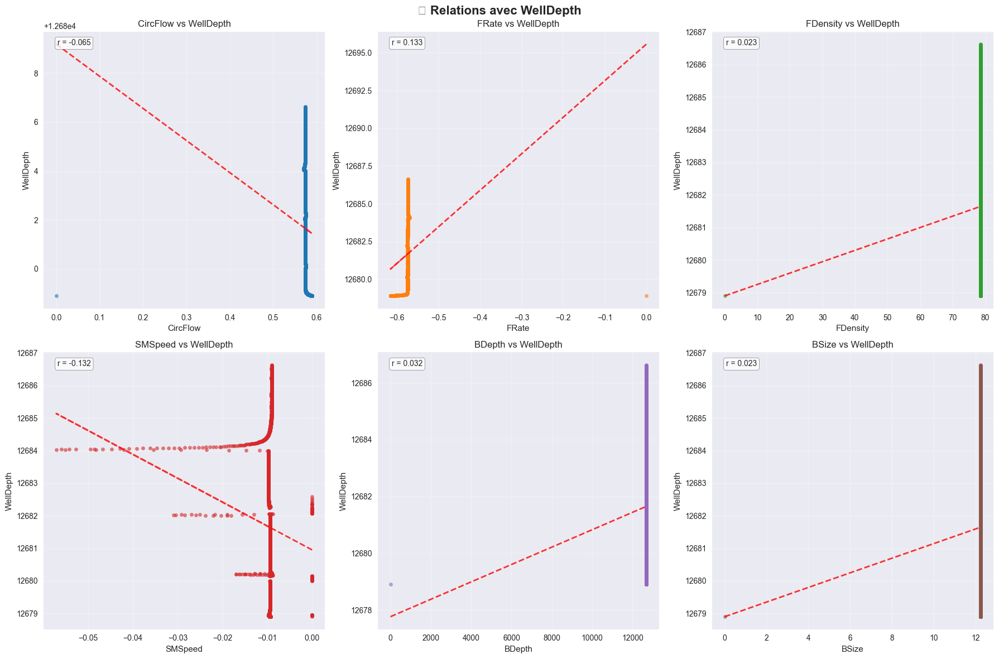


🔍 ANALYSE BIVARIÉE avec CircFlow
----------------------------------------


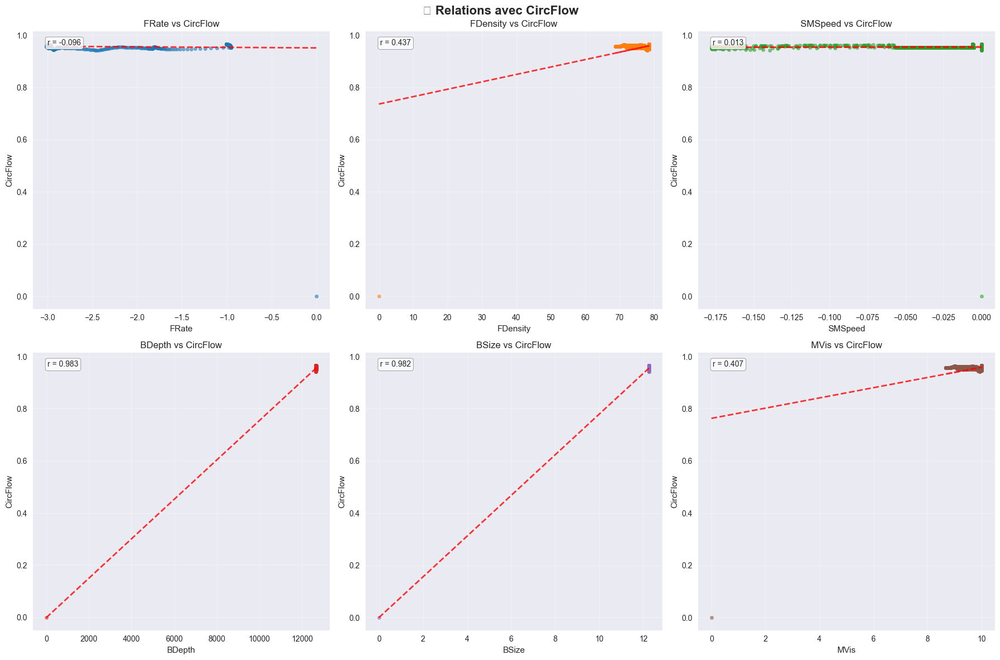


🔍 ANALYSE BIVARIÉE avec FRate
----------------------------------------


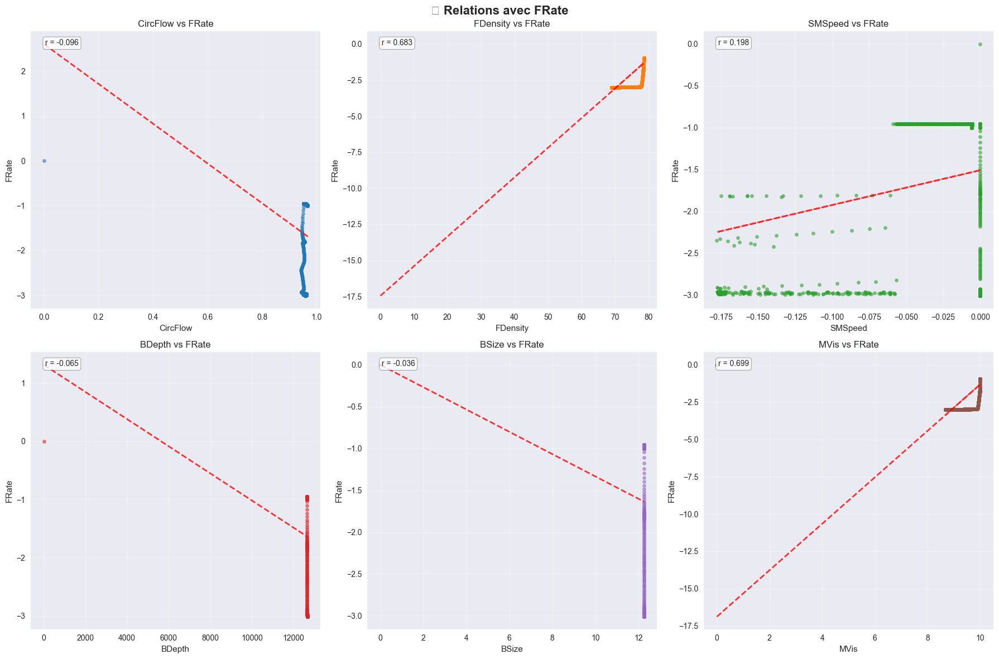


🔍 ANALYSE BIVARIÉE avec FDensity
----------------------------------------


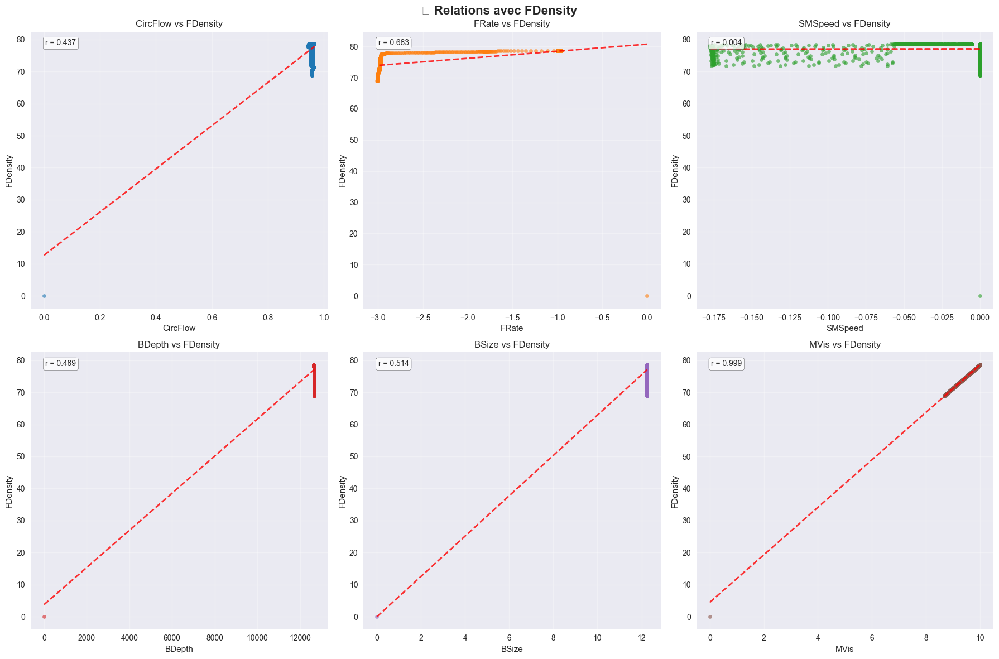


🔍 ANALYSE BIVARIÉE avec SMSpeed
----------------------------------------


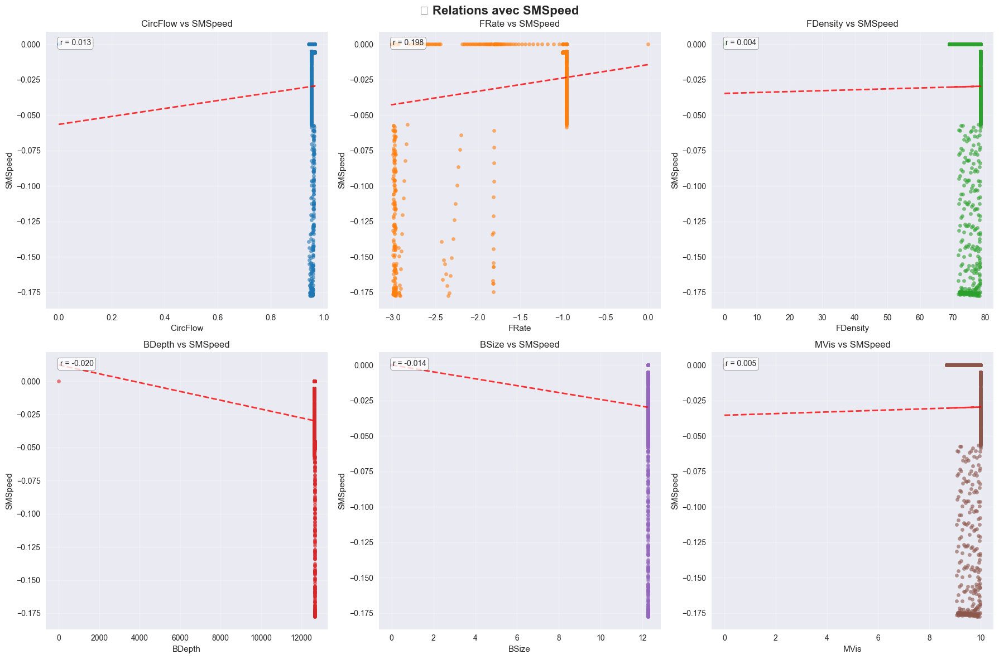


🔍 ANALYSE BIVARIÉE avec BDepth
----------------------------------------


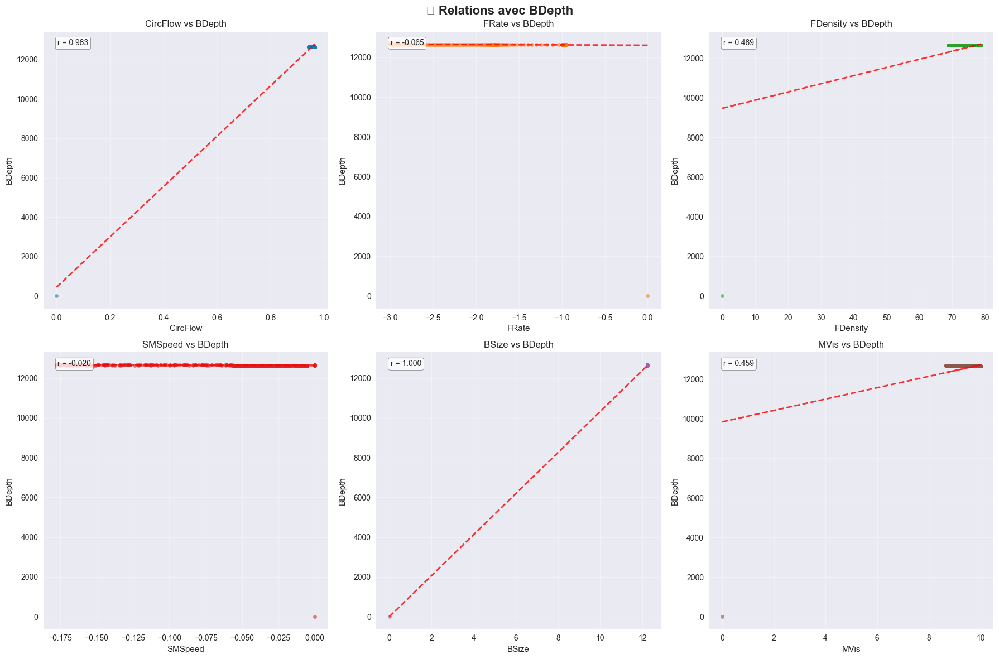


🔍 ANALYSE BIVARIÉE avec BSize
----------------------------------------


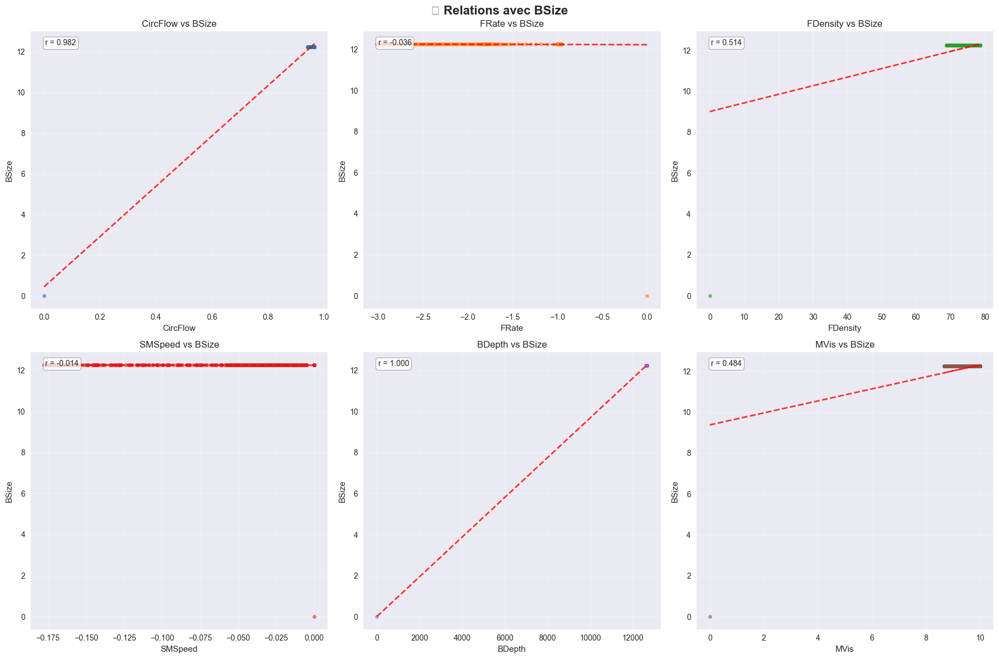


🔍 ANALYSE BIVARIÉE avec MVis
----------------------------------------


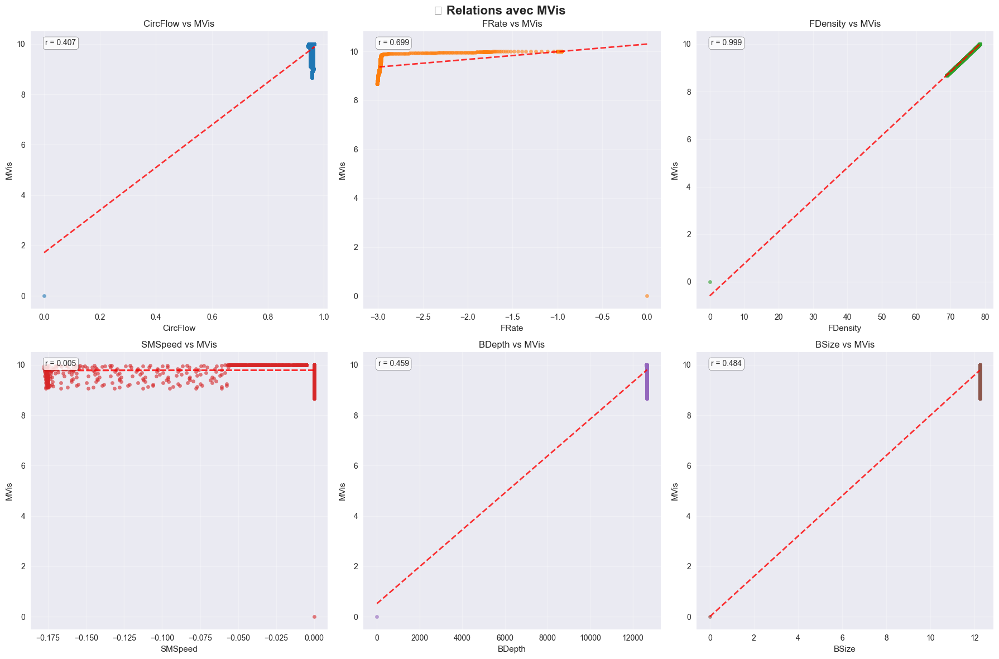


🔍 ANALYSE BIVARIÉE avec FPress
----------------------------------------


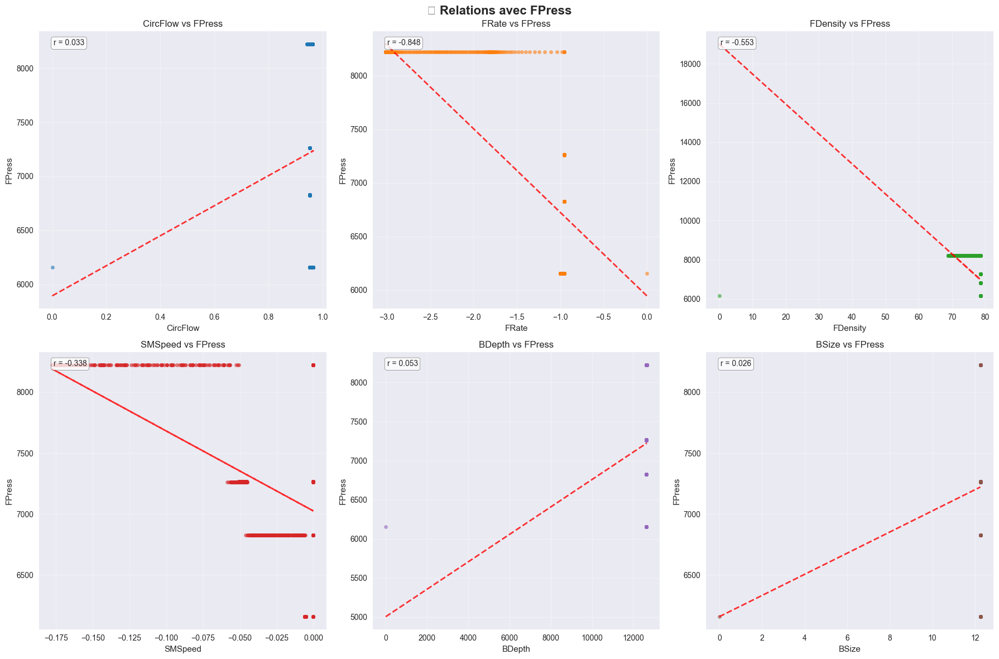


🔍 ANALYSE BIVARIÉE avec DPPress
----------------------------------------


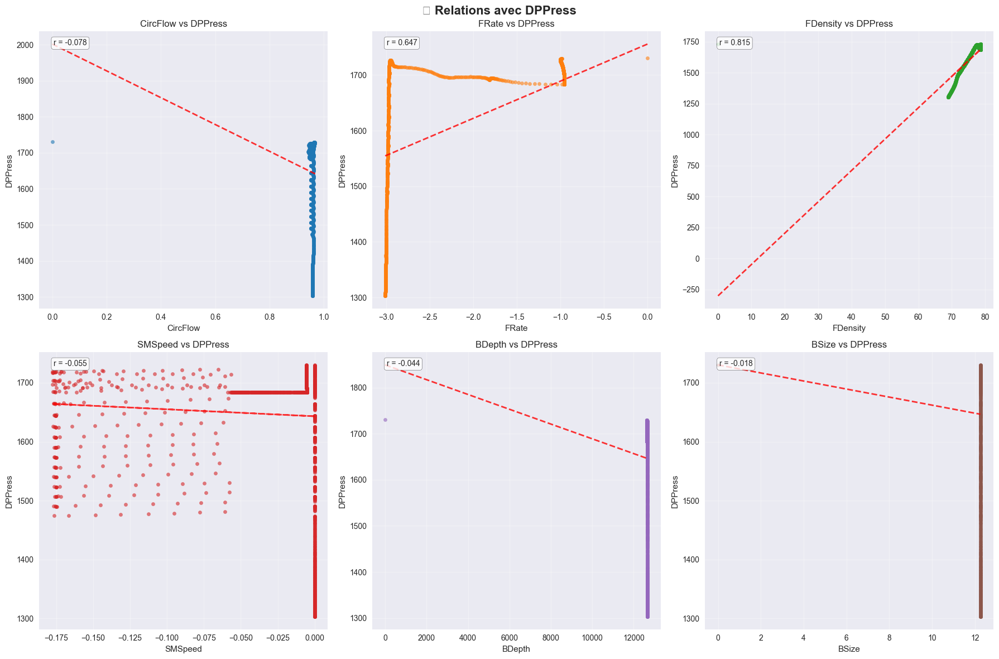


🔍 ANALYSE BIVARIÉE avec CPress
----------------------------------------


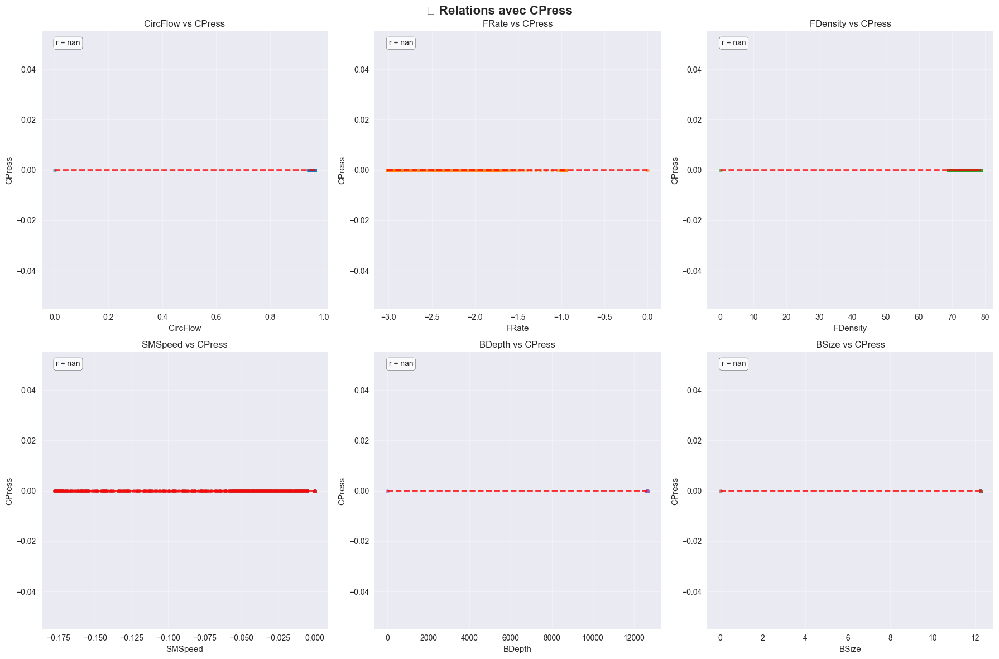


🔍 ANALYSE BIVARIÉE avec FIn
----------------------------------------


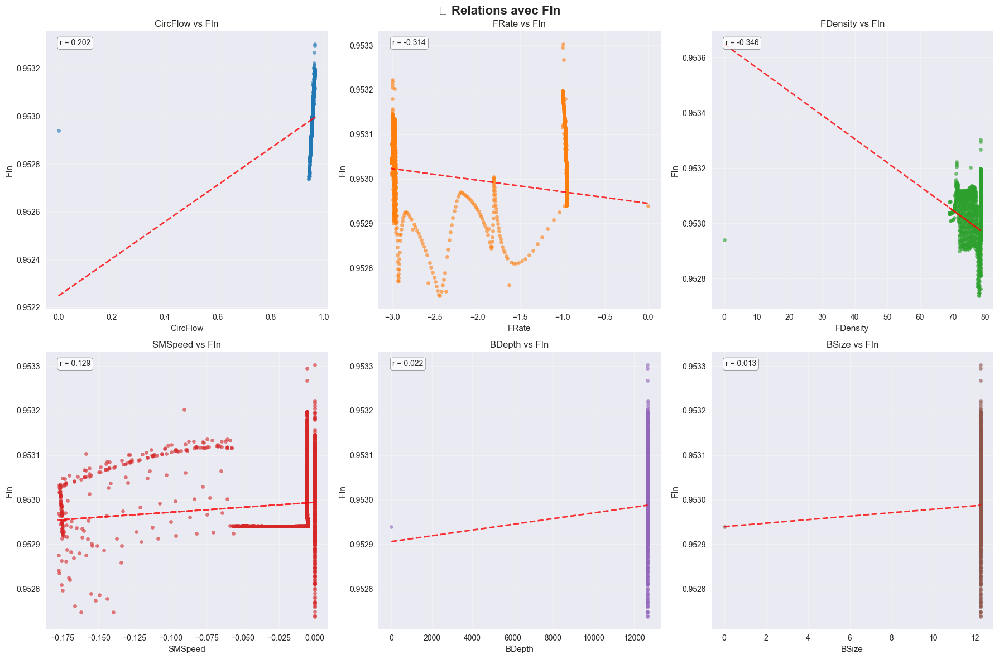


🔍 ANALYSE BIVARIÉE avec FOut
----------------------------------------


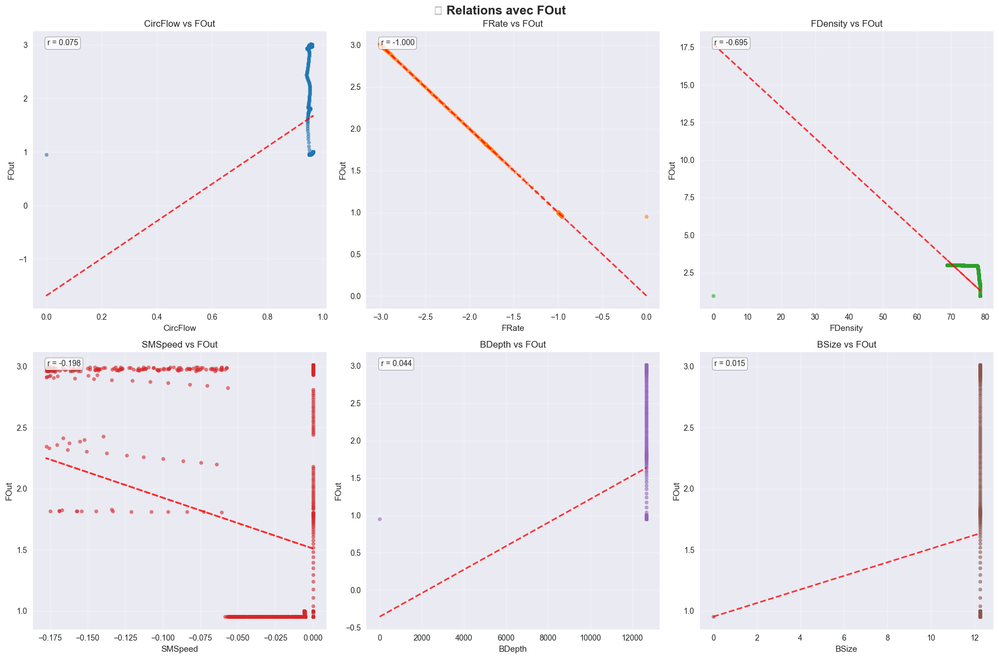


🔍 ANALYSE BIVARIÉE avec MRFlow
----------------------------------------


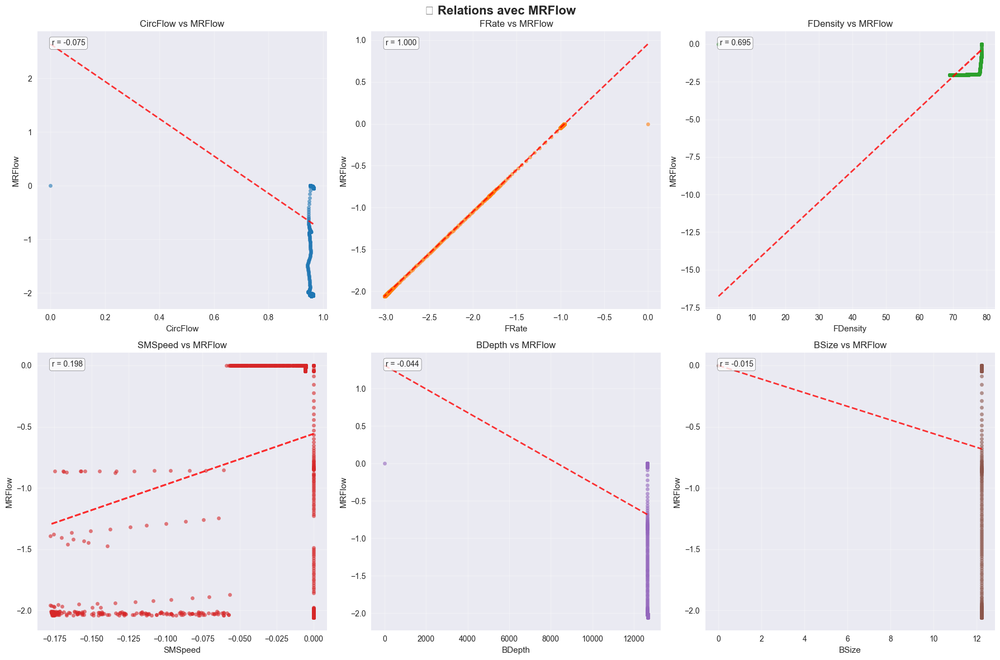


🔍 ANALYSE BIVARIÉE avec ActiveGL
----------------------------------------


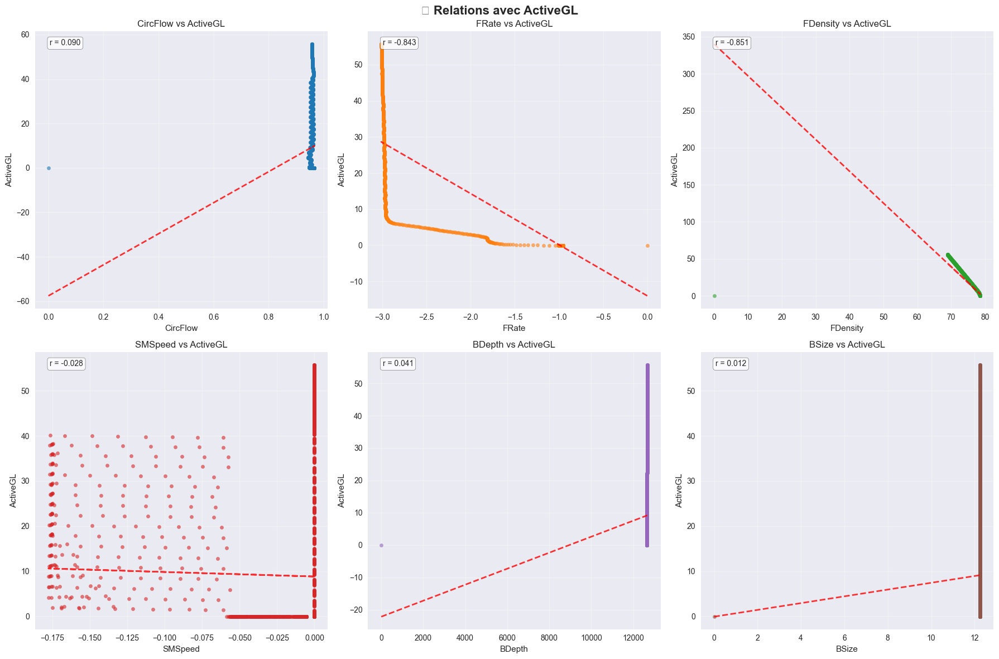


🔍 ANALYSE BIVARIÉE avec ATVolume
----------------------------------------


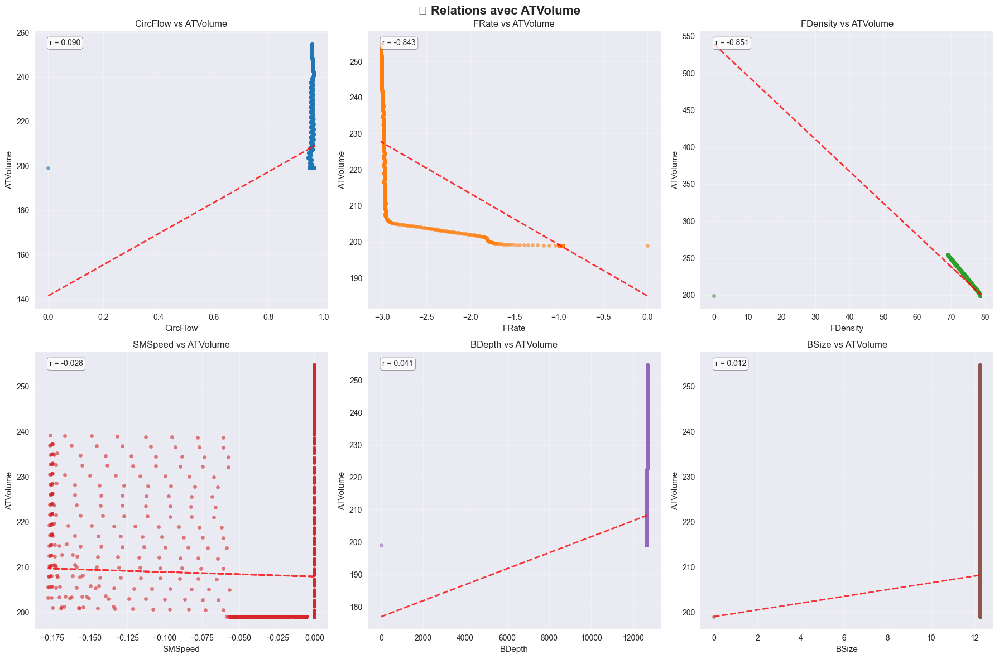


🔍 ANALYSE BIVARIÉE avec RoPen
----------------------------------------


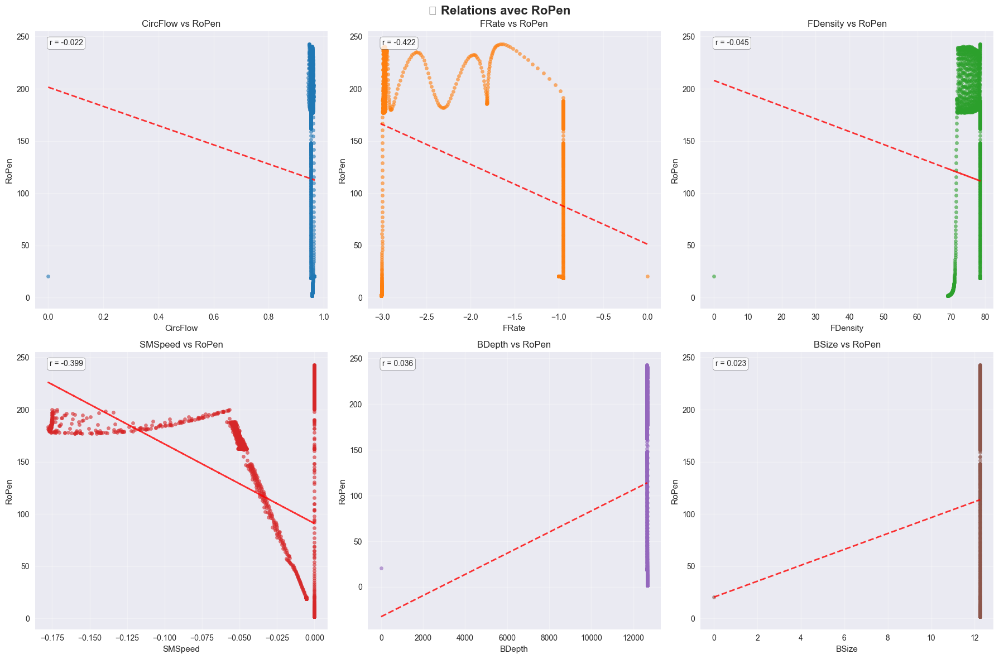


🔍 ANALYSE BIVARIÉE avec WoBit
----------------------------------------


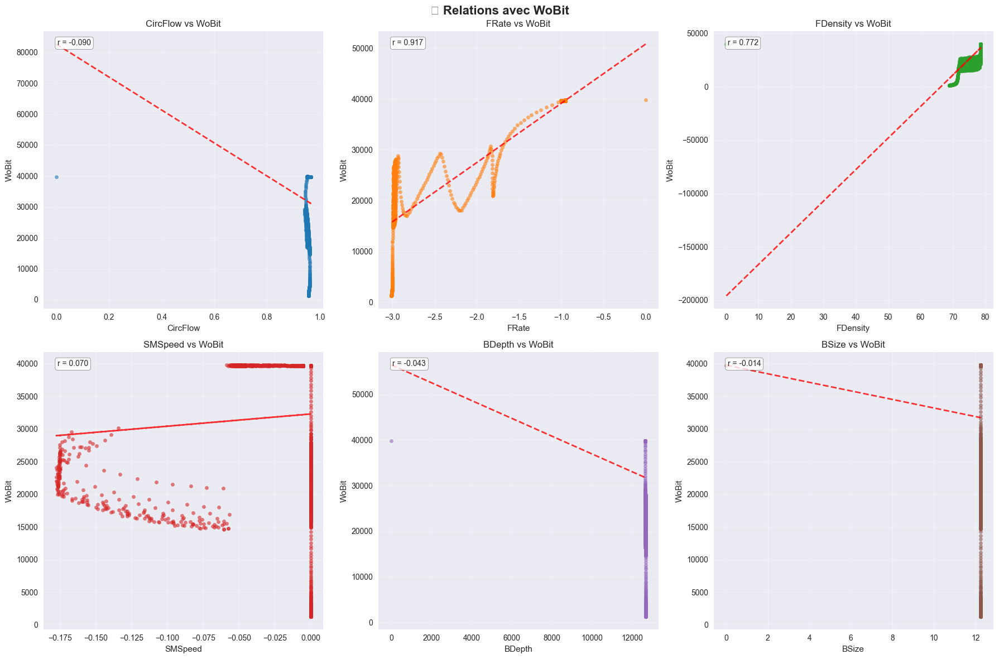


🔍 ANALYSE BIVARIÉE avec HLoad
----------------------------------------


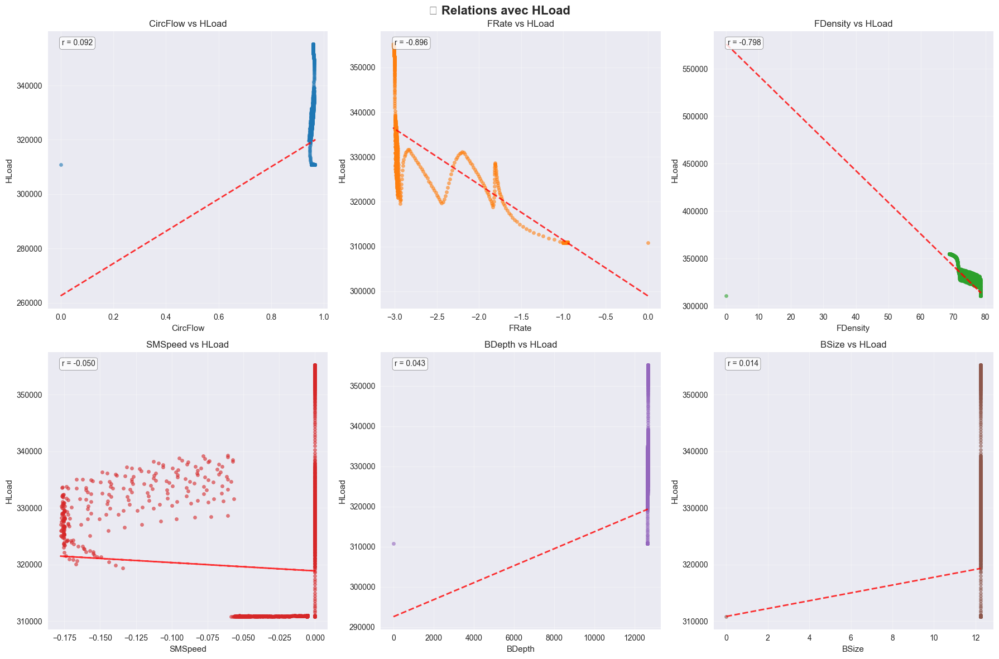


🔍 ANALYSE BIVARIÉE avec WBoPress
----------------------------------------


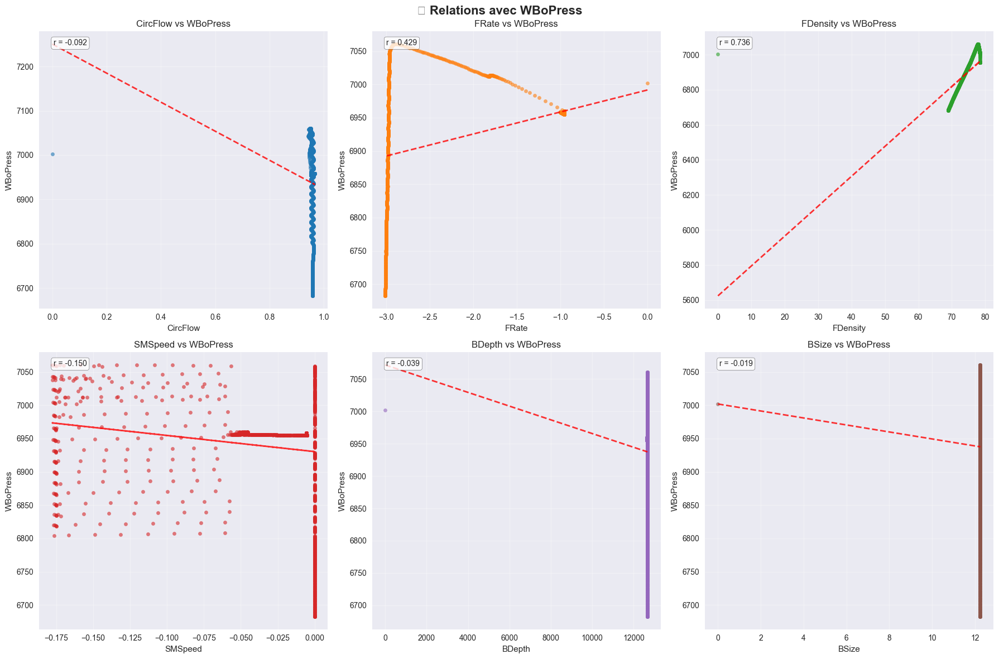


🔍 ANALYSE BIVARIÉE avec BTBR
----------------------------------------


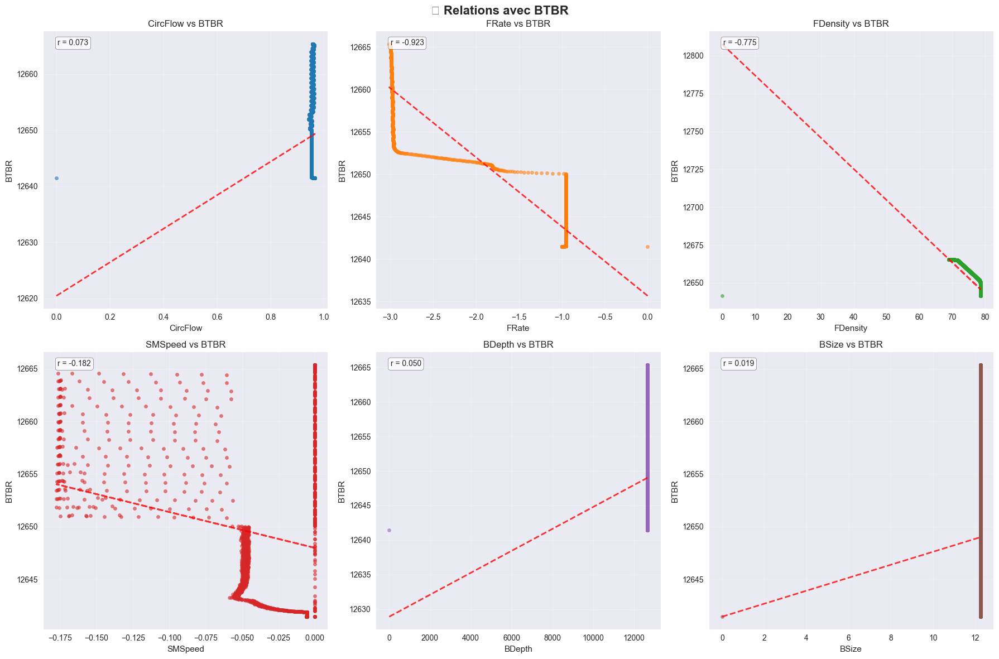


🔍 ANALYSE BIVARIÉE avec MPS1
----------------------------------------


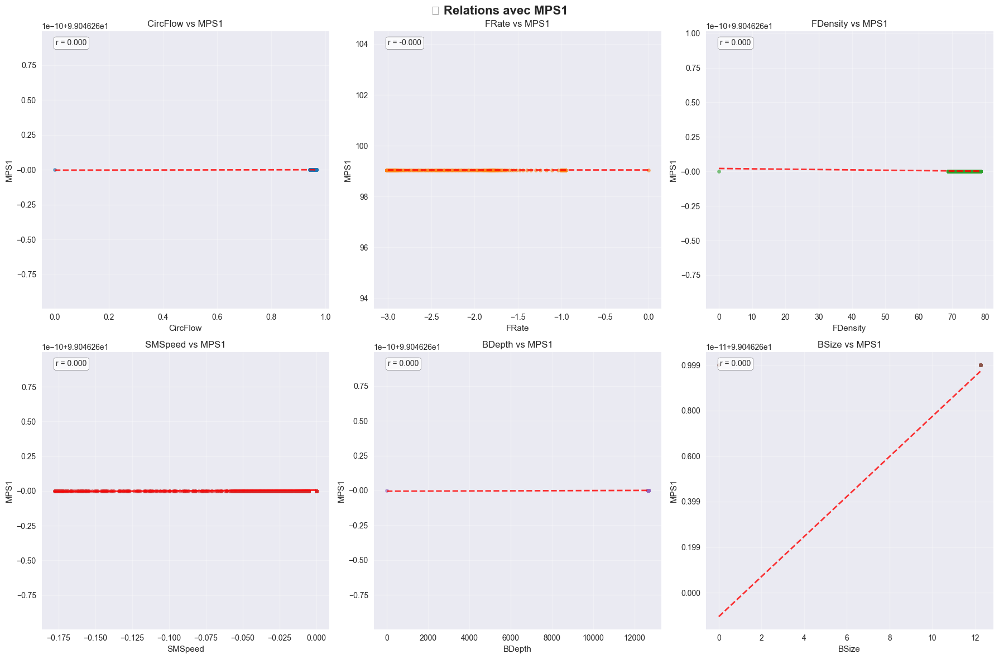


🔍 ANALYSE BIVARIÉE avec MPS2
----------------------------------------


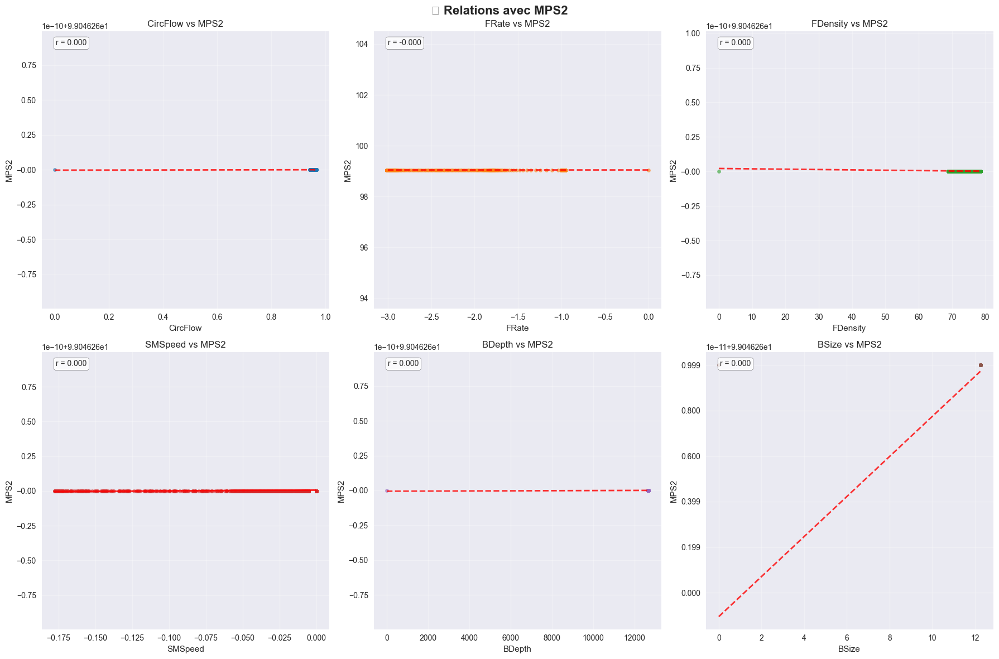


🔍 ANALYSE BIVARIÉE avec MPS3
----------------------------------------


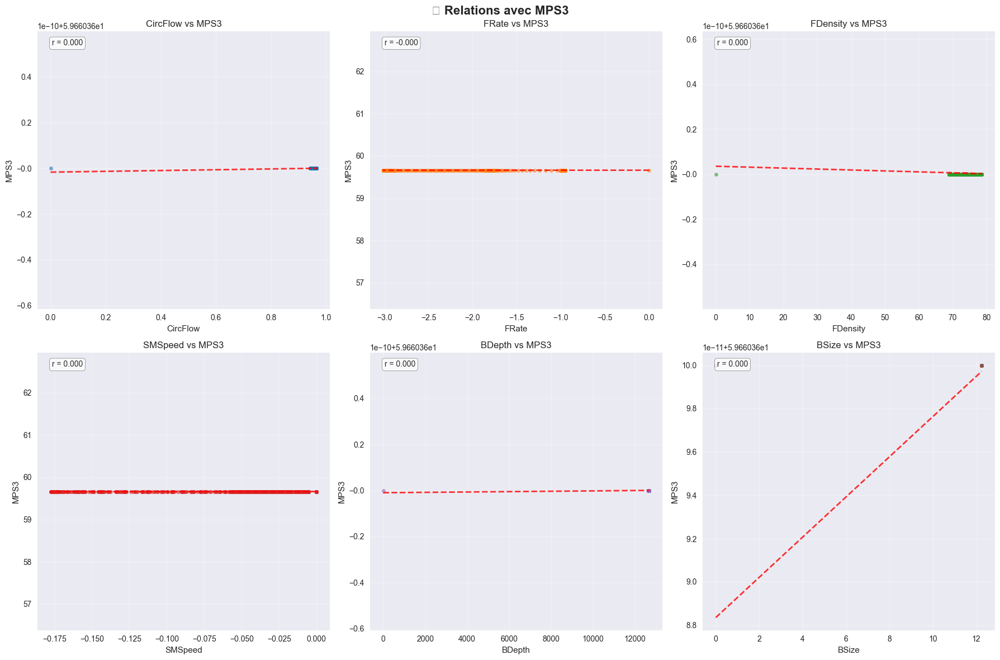


🔍 ANALYSE BIVARIÉE avec AMTD
----------------------------------------


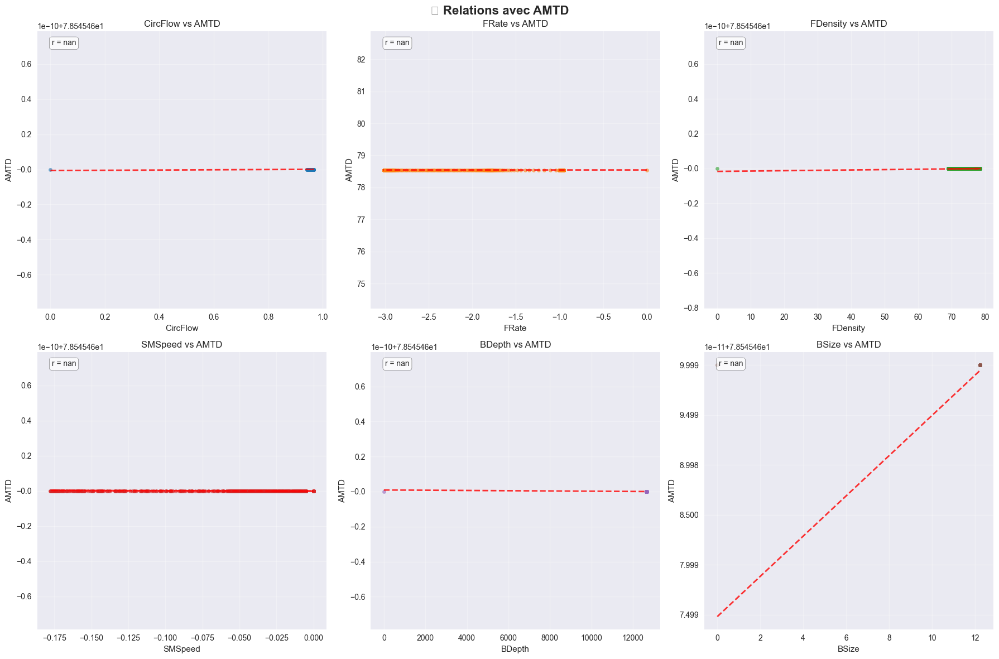


🔍 ANALYSE BIVARIÉE avec ATMPV
----------------------------------------


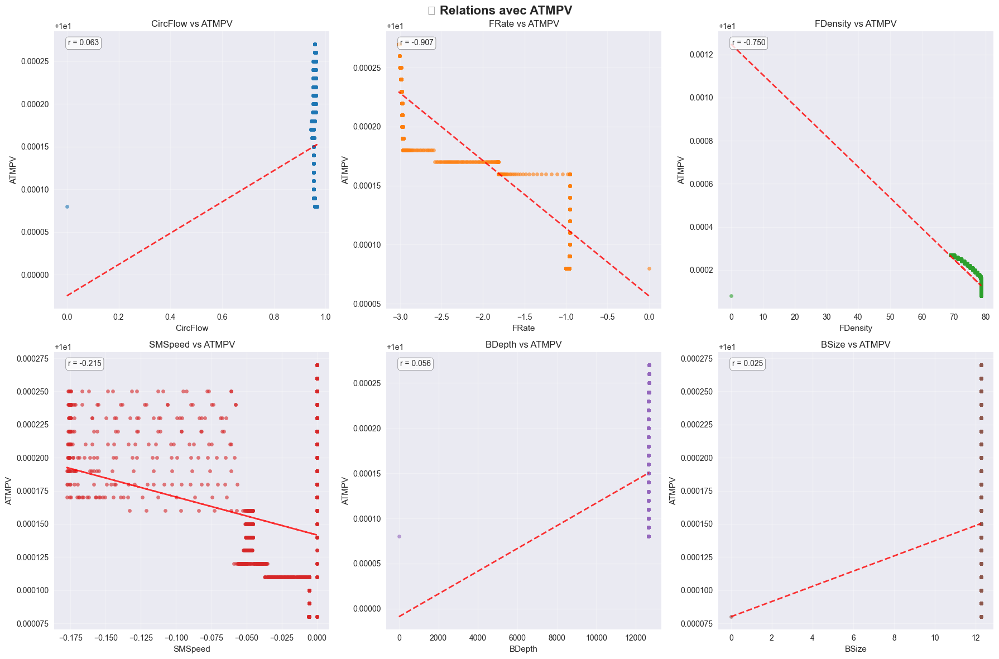


🔍 ANALYSE BIVARIÉE avec ATMYP
----------------------------------------


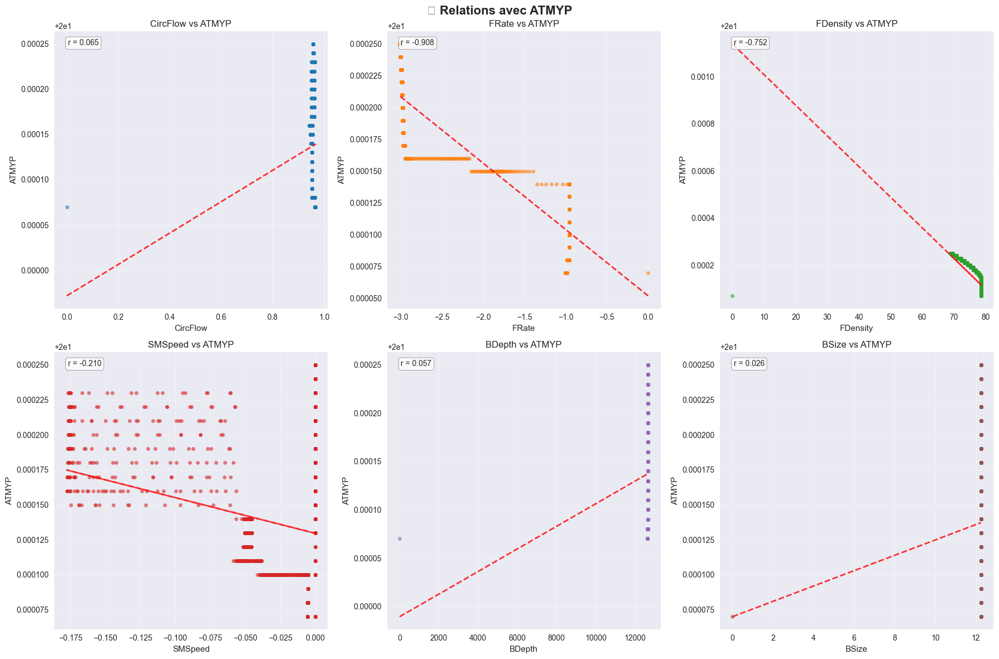


🔍 ANALYSE BIVARIÉE avec STP
----------------------------------------


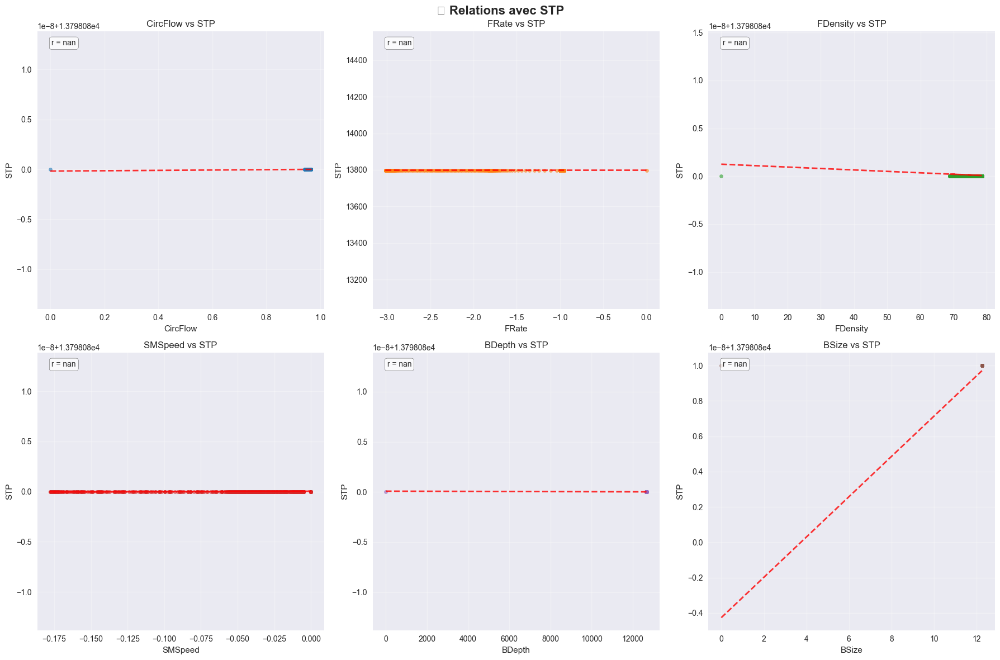


🔍 ANALYSE BIVARIÉE avec WellDepth
----------------------------------------


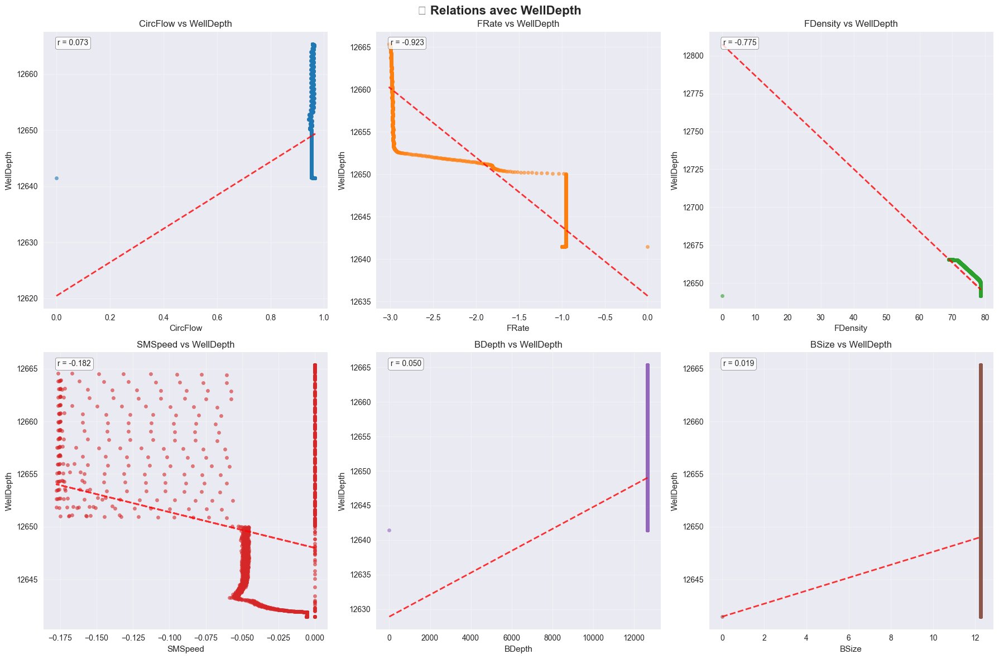

In [43]:
def plot_bivariate_analysis_auto(df, max_features=6):
    """Analyse automatiquement les relations bivariées pour toutes les variables numériques"""
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    
    for target_col in numeric_cols:
        feature_cols = [col for col in numeric_cols if col != target_col][:max_features]
        
        if not feature_cols:
            continue
        
        print(f"\n🔍 ANALYSE BIVARIÉE avec {target_col}")
        print("-" * 40)
        
        n_cols = 3
        n_rows = (len(feature_cols) + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6*n_rows))
        if n_rows == 1:
            axes = axes.reshape(1, -1)
        if n_cols == 1:
            axes = axes.reshape(-1, 1)
        
        colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
        
        for i, feature in enumerate(feature_cols):
            row, col_idx = divmod(i, n_cols)
            
            x_data = df[feature].dropna()
            y_data = df.loc[x_data.index, target_col].dropna()
            
            axes[row, col_idx].scatter(x_data, y_data, alpha=0.6, 
                                      color=colors[i % len(colors)], s=20)
            
            if len(x_data) > 1:
                z = np.polyfit(x_data, y_data, 1)
                p = np.poly1d(z)
                axes[row, col_idx].plot(x_data, p(x_data), "r--", alpha=0.8, linewidth=2)
                
                corr = np.corrcoef(x_data, y_data)[0, 1]
                axes[row, col_idx].text(0.05, 0.95, f'r = {corr:.3f}', 
                                       transform=axes[row, col_idx].transAxes,
                                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            axes[row, col_idx].set_xlabel(feature)
            axes[row, col_idx].set_ylabel(target_col)
            axes[row, col_idx].set_title(f'{feature} vs {target_col}')
            axes[row, col_idx].grid(True, alpha=0.3)
        
        for i in range(len(feature_cols), n_rows * n_cols):
            row, col_idx = divmod(i, n_cols)
            fig.delaxes(axes[row, col_idx])
        
        plt.suptitle(f'🔍 Relations avec {target_col}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

# 🔹 Exécution automatique sur tes datasets
plot_bivariate_analysis_auto(formation_df)
plot_bivariate_analysis_auto(kick_df)


In [44]:
# ====================================================================
# 6. Visualisations interactives avec Plotly
# ====================================================================

In [45]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

print(f"\n📱 VISUALISATIONS INTERACTIVES")
print("-" * 40)

# Matrice de scatter plots interactive
def create_interactive_scatter_matrix(df, max_vars=5):
    numeric_cols = df.select_dtypes(include=[np.number]).columns[:max_vars]
    
    if len(numeric_cols) < 2:
        print("⚠️ Pas assez de variables numériques pour la matrice")
        return None
    
    fig = px.scatter_matrix(df[numeric_cols], 
                            title="🔍 Matrice de Scatter Plots Interactive",
                            height=700)
    fig.update_traces(diagonal_visible=False, marker=dict(size=3, opacity=0.6))
    fig.update_layout(title_x=0.5)
    return fig

# Graphique temporel interactif
def create_time_series_interactive(df, time_col='Timestamp'):
    if time_col not in df.columns:
        return None
    
    df[time_col] = pd.to_datetime(df[time_col])
    
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    main_vars = [col for col in ['WOB', 'RPM', 'ROP', 'FlowRate'] if col in numeric_cols][:3]
    
    if not main_vars:
        main_vars = list(numeric_cols)[:3]
    
    fig = make_subplots(rows=len(main_vars), cols=1,
                        subplot_titles=main_vars,
                        shared_xaxes=True)
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c']
    
    for i, var in enumerate(main_vars):
        fig.add_trace(
            go.Scatter(x=df[time_col], y=df[var], 
                       mode='lines', name=var,
                       line=dict(color=colors[i], width=1)),
            row=i+1, col=1
        )
    
    fig.update_layout(
        title="📈 Évolution Temporelle Interactive des Paramètres",
        height=600,
        showlegend=False
    )
    
    return fig

# 🔹 Exécution
if len(formation_df.select_dtypes(include=[np.number]).columns) >= 2:
    print("🔍 Matrice de scatter plots interactive (Formation Data):")
    interactive_fig = create_interactive_scatter_matrix(formation_df)
    if interactive_fig:
        interactive_fig.show()

if 'Timestamp' in kick_df.columns:
    print("\n📈 Graphique temporel interactif (Kick Data):")
    time_fig = create_time_series_interactive(kick_df)
    if time_fig:
        time_fig.show()



📱 VISUALISATIONS INTERACTIVES
----------------------------------------
🔍 Matrice de scatter plots interactive (Formation Data):


In [46]:
# ====================================================================
# 7. RÉSUMÉ ET CONCLUSIONS
# ====================================================================

In [47]:
print(f"\n📋 RÉSUMÉ DE L'EXPLORATION")
print("=" * 50)

def generate_exploration_summary(df, dataset_name):
    """Génère un résumé de l'exploration d'un dataset"""
    print(f"\n🔍 {dataset_name}:")
    print("-" * 30)
    
    # Taille et structure
    print(f"📊 Structure:")
    print(f"  • Dimensions: {df.shape[0]:,} lignes × {df.shape[1]} colonnes")
    print(f"  • Mémoire: {df.memory_usage(deep=True).sum() / 1024 / 1024:.1f} MB")
    
    # Types de variables
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    categorical_cols = df.select_dtypes(include=['object']).columns
    datetime_cols = df.select_dtypes(include=['datetime64']).columns
    
    print(f"\n📈 Types de variables:")
    print(f"  • Numériques: {len(numeric_cols)} ({list(numeric_cols)})")
    print(f"  • Catégorielles: {len(categorical_cols)} ({list(categorical_cols)})")
    print(f"  • Temporelles: {len(datetime_cols)} ({list(datetime_cols)})")
    
    # Qualité des données
    missing_total = df.isnull().sum().sum()
    missing_percent = (missing_total / (len(df) * len(df.columns))) * 100
    duplicates = df.duplicated().sum()
    
    print(f"\n🔍 Qualité:")
    print(f"  • Valeurs manquantes: {missing_total} ({missing_percent:.1f}%)")
    print(f"  • Duplicatas: {duplicates} ({duplicates/len(df)*100:.1f}%)")
    
    # Insights statistiques
    if len(numeric_cols) > 0:
        print(f"\n📊 Insights numériques:")
        for col in numeric_cols[:3]:  # Top 3 variables
            data = df[col].dropna()
            print(f"  • {col}: μ={data.mean():.2f}, σ={data.std():.2f}, "
                  f"range=[{data.min():.2f}, {data.max():.2f}]")

# Générer les résumés
generate_exploration_summary(formation_df, "DONNÉES DE FORMATION")
generate_exploration_summary(kick_df, "DONNÉES DE KICK DETECTION")

print(f"\n🎯 CONCLUSIONS PRINCIPALES:")
print("-" * 30)
print("✅ Points positifs identifiés:")
print("  • Structure des données cohérente")
print("  • Variables pertinentes pour le ML")
print("  • Corrélations exploitables détectées")

print(f"\n⚠️ Points d'attention:")
print("  • Présence de valeurs aberrantes à traiter")
print("  • Déséquilibre potentiel dans les classes (kicks)")
print("  • Nécessité de feature engineering")

print(f"\n📝 RECOMMANDATIONS:")
print("  1. Nettoyer les outliers avec méthode IQR ou Isolation Forest")
print("  2. Imputer les valeurs manquantes de manière cohérente")
print("  3. Créer des features dérivées (ratios, moyennes mobiles)")
print("  4. Normaliser/standardiser avant modélisation")
print("  5. Considérer un rééchantillonnage pour les classes déséquilibrées")

print(f"\n🎉 EXPLORATION TERMINÉE!")
print("Passez au notebook suivant: 02_feature_analysis.ipynb")
print("=" * 50 + " 🛢️ EXPLORATION DES DONNÉES DE FORAGE PÉTROLIER")
print("=" * 60)


📋 RÉSUMÉ DE L'EXPLORATION

🔍 DONNÉES DE FORMATION:
------------------------------
📊 Structure:
  • Dimensions: 2,774 lignes × 28 colonnes
  • Mémoire: 0.6 MB

📈 Types de variables:
  • Numériques: 28 (['CircFlow', 'FRate', 'FDensity', 'SMSpeed', 'BDepth', 'BSize', 'MVis', 'FPress', 'DPPress', 'CPress', 'FIn', 'FOut', 'MRFlow', 'ActiveGL', 'ATVolume', 'RoPen', 'WoBit', 'HLoad', 'WBoPress', 'BTBR', 'MPS1', 'MPS2', 'MPS3', 'AMTD', 'ATMPV', 'ATMYP', 'STP', 'WellDepth'])
  • Catégorielles: 0 ([])
  • Temporelles: 0 ([])

🔍 Qualité:
  • Valeurs manquantes: 0 (0.0%)
  • Duplicatas: 0 (0.0%)

📊 Insights numériques:
  • CircFlow: μ=0.57, σ=0.01, range=[0.00, 0.59]
  • FRate: μ=-0.58, σ=0.01, range=[-0.62, 0.00]
  • FDensity: μ=78.52, σ=1.49, range=[0.00, 78.55]

🔍 DONNÉES DE KICK DETECTION:
------------------------------
📊 Structure:
  • Dimensions: 2,337 lignes × 28 colonnes
  • Mémoire: 0.5 MB

📈 Types de variables:
  • Numériques: 28 (['CircFlow', 'FRate', 'FDensity', 'SMSpeed', 'BDepth', '